In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [4]:
# Read in a image from torchvision
import torchvision
img = torchvision.io.read_image("Saitama.jpg") # image is in the same folder as this file.
print(img.shape)

torch.Size([3, 1080, 1921])


In [5]:
# Make grayscale
img = torch.tensor(img, dtype=torch.float)
img = img.mean(dim=0, keepdim=False)
print(img.shape)

torch.Size([1080, 1921])


C:\Users\persu\AppData\Local\Temp\ipykernel_9888\232810751.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)


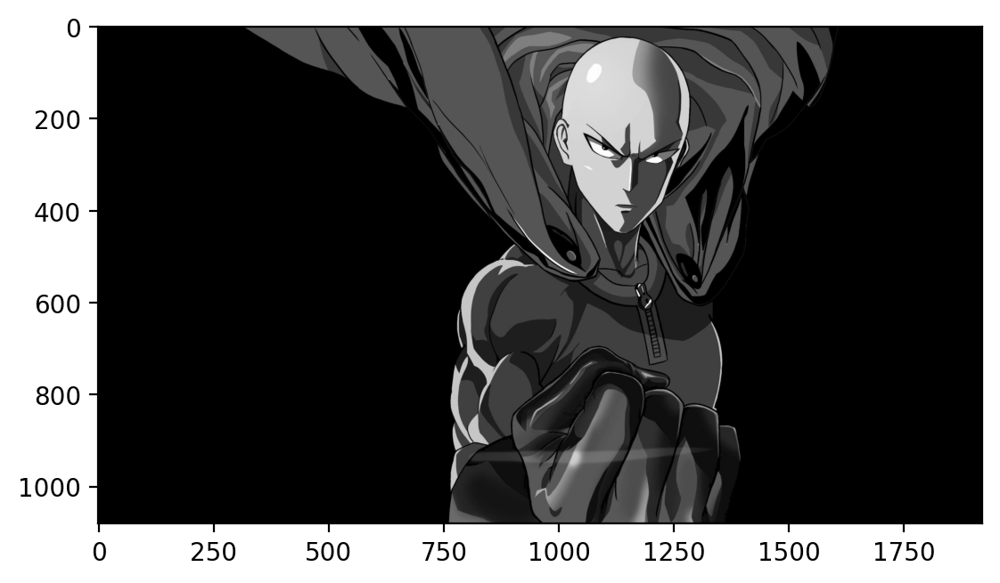

In [56]:
plt.imshow(img, cmap='gray')

In [7]:
crop = torchvision.transforms.functional.crop(img, 30, 950, 300, 300) #(img, starting y coordinate, starting x coordiante, size in x, size in y)
crop.shape


torch.Size([300, 300])

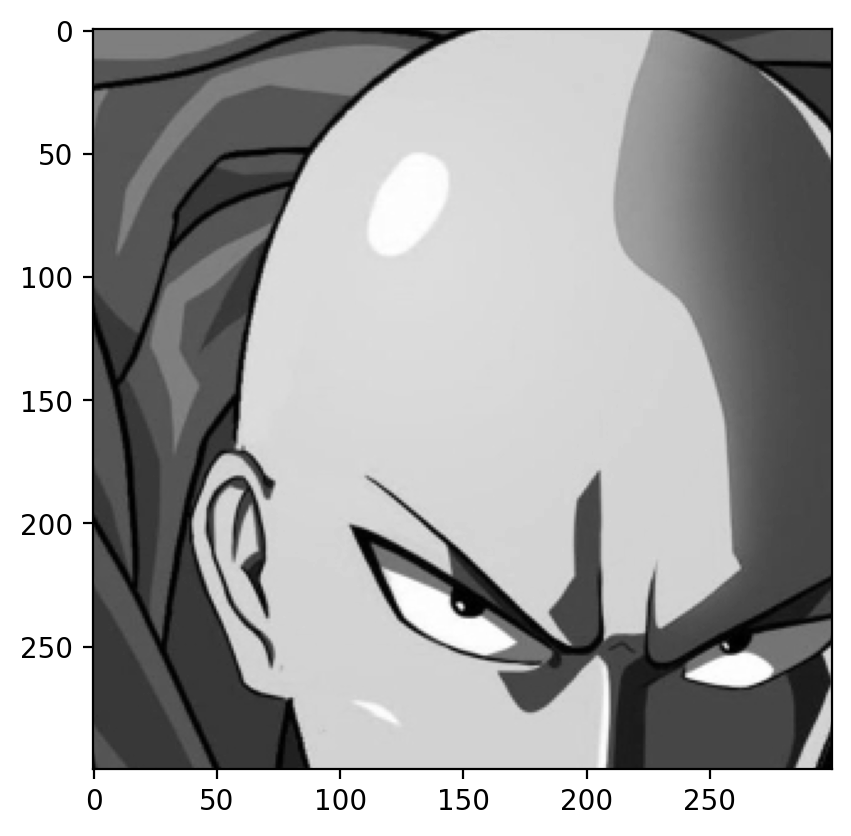

In [8]:
plt.imshow(crop, cmap='gray')

In [43]:
def factorize(A, r, device=torch.device("cpu")):
    """Factorize the matrix A into W and H
    A: input matrix of size (n_users, n_movies)
    k: number of latent features
    
    Returns W and H
    W: matrix of size (n_users, k)
    H: matrix of size (k, n_movies)
    """
    A = A.to(device)
    # Randomly initialize W and H
    W = torch.randn(A.shape[0], r, requires_grad=True, device=device)
    H = torch.randn(r, A.shape[1], requires_grad=True, device=device)
    
    # Optimizer
    optimizer = optim.Adam([W, H], lr=0.01)
    
    mask = ~torch.isnan(A) 

    current_loss = 0
    prev_loss = 0
    no_epochs = 0

    # Train the model
    for i in range(5001):
        # Compute the loss
        diff_matrix = torch.mm(W, H) - A
        diff_vector = diff_matrix[mask]
        loss = torch.norm(diff_vector)
        
        # Zero the gradients
        optimizer.zero_grad()
        
        # Backpropagate
        loss.backward()
        
        # Update the parameters
        optimizer.step()

        # Stopping condition
        prev_loss = current_loss
        current_loss = loss.item()

        if abs(current_loss - prev_loss) < 0.0001:
            break

        no_epochs += 1
    
    # Printing loss after certain epochs:
    print("Loss:", loss.item())
    print("Number of epochs", no_epochs)
    print("Number of Features:", r)
    
    # Printing RMSE and PSNR:
    diff_matrix = A - torch.mm(W, H)
    diff_vector = diff_matrix[mask]
    mse = torch.mean(diff_vector ** 2)
    rmse = torch.sqrt(mse)
    print("Root Mean Squared Error:", rmse.item())

    psnr = 10 * torch.log10(255**2 / mse)
    print("Peak Signal to Noise Ratio:", psnr.item())

    # Showing the reconstructed and orignal image:
    plt.subplot(1,2, 1)
    plt.imshow(torch.mm(W, H).cpu().detach().numpy(), cmap='gray', )
    plt.title("Reconstructed Image")
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(A, cmap='gray')
    plt.title("Orignal Image")
    plt.axis('off')
    plt.show()
        
    return rmse.item(), psnr.item(), loss.item() # will be using these in graph plotting 

Loss: 49079.09375
Number of epochs 1
Number of Features: 0
Root Mean Squared Error: 163.5973663330078
Peak Signal to Noise Ratio: 3.8552770614624023


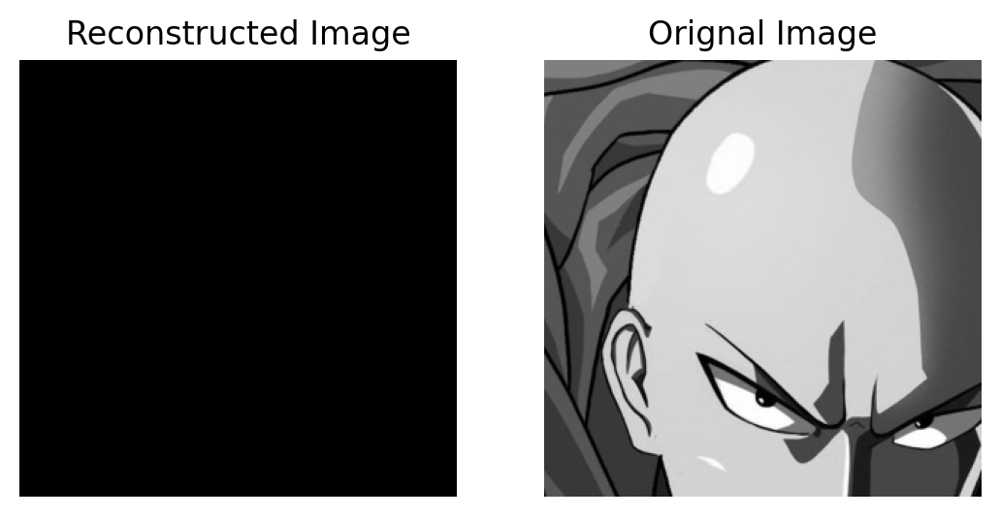

Loss: 5010.54736328125
Number of epochs 4894
Number of Features: 20
Root Mean Squared Error: 16.70181655883789
Peak Signal to Noise Ratio: 23.67552947998047


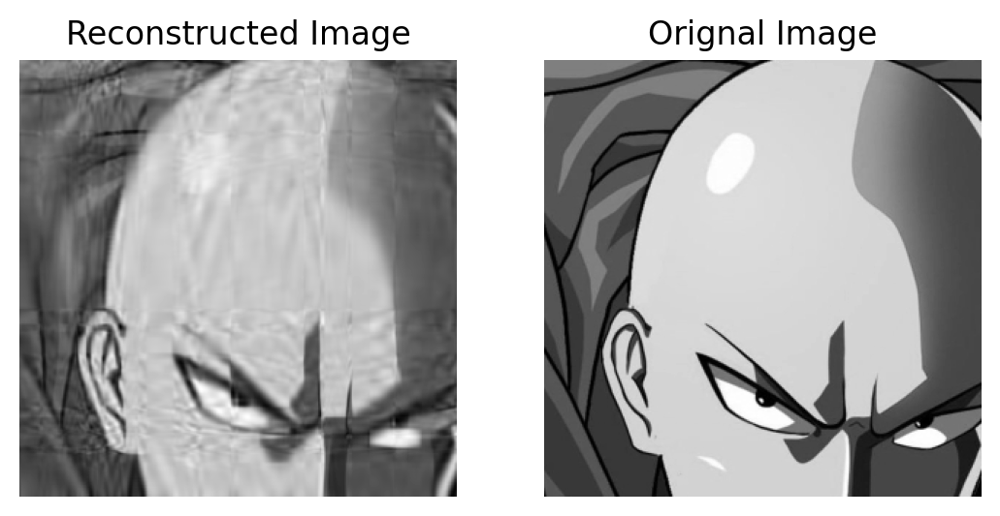

Loss: 2965.09033203125
Number of epochs 3051
Number of Features: 40
Root Mean Squared Error: 9.883631706237793
Peak Signal to Noise Ratio: 28.232471466064453


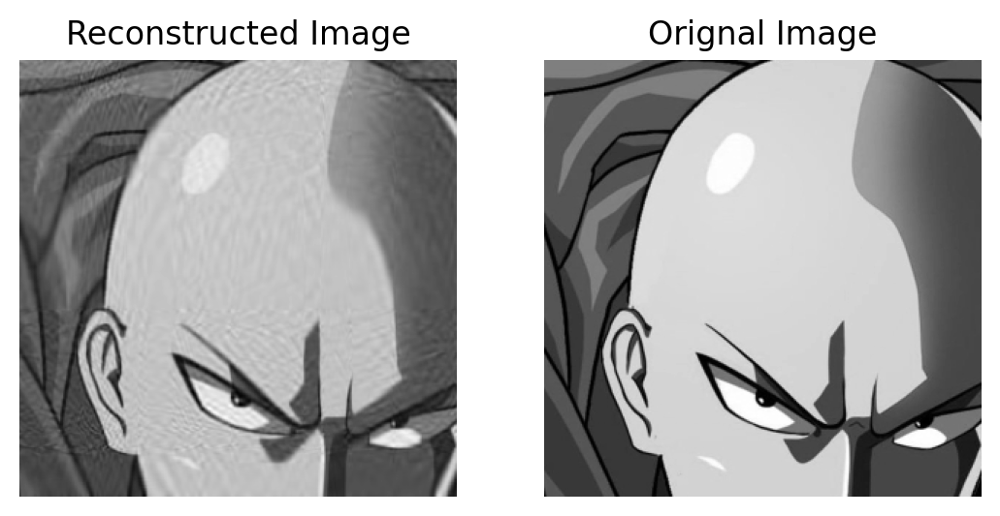

Loss: 1952.7379150390625
Number of epochs 2456
Number of Features: 60
Root Mean Squared Error: 6.509128093719482
Peak Signal to Noise Ratio: 31.860347747802734


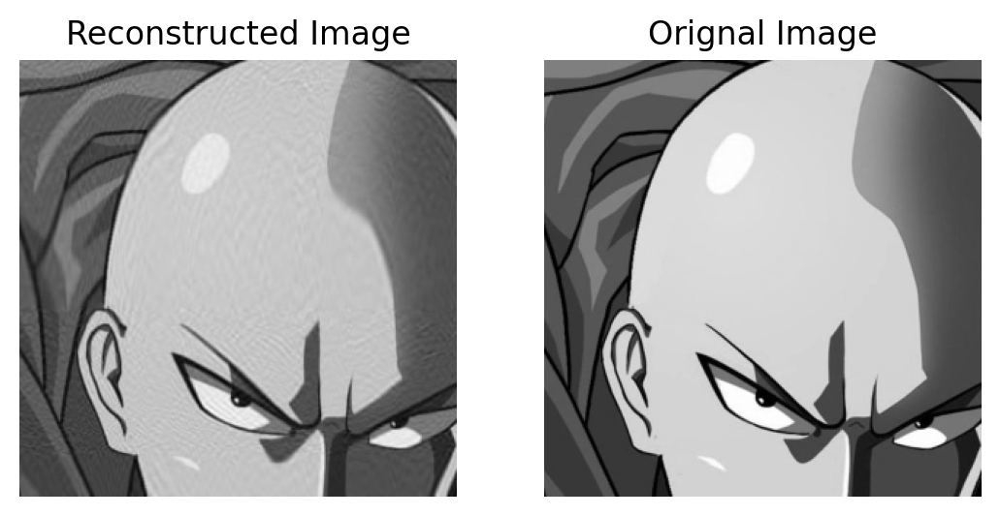

Loss: 1324.4434814453125
Number of epochs 3660
Number of Features: 80
Root Mean Squared Error: 4.4148149490356445
Peak Signal to Noise Ratio: 35.23255157470703


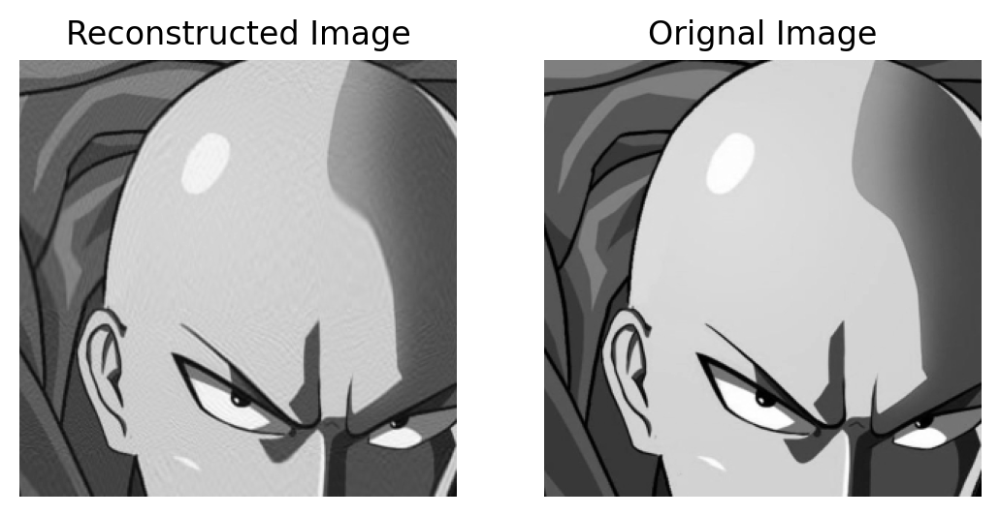

Loss: 907.8350219726562
Number of epochs 2452
Number of Features: 100
Root Mean Squared Error: 3.0261178016662598
Peak Signal to Noise Ratio: 38.513084411621094


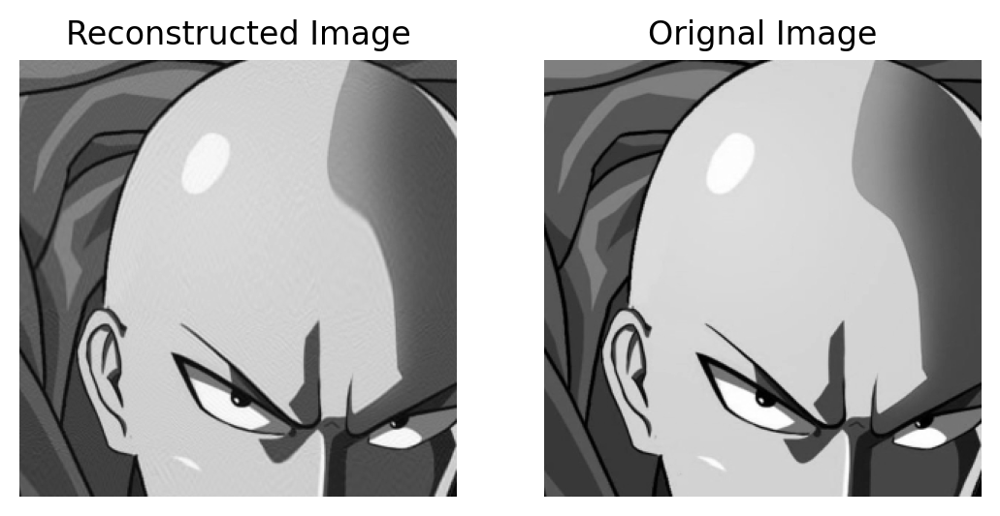

Loss: 620.4602661132812
Number of epochs 1916
Number of Features: 120
Root Mean Squared Error: 2.068189859390259
Peak Signal to Noise Ratio: 41.81899642944336


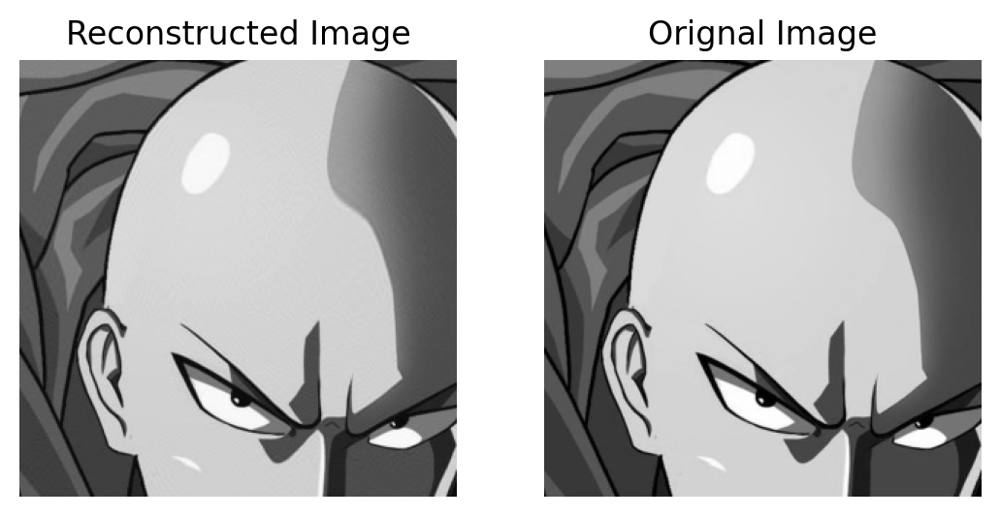

Loss: 425.97662353515625
Number of epochs 1815
Number of Features: 140
Root Mean Squared Error: 1.4198683500289917
Peak Signal to Noise Ratio: 45.085838317871094


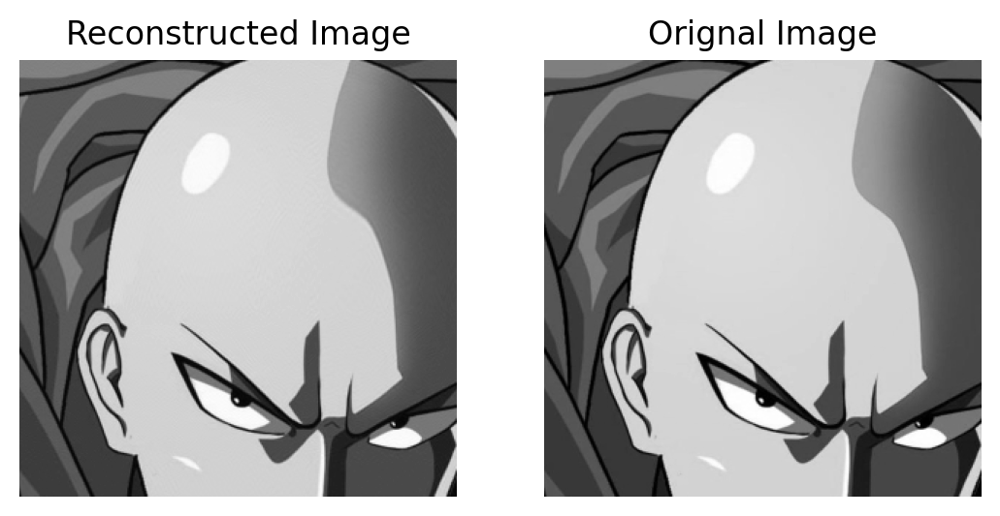

Loss: 291.59637451171875
Number of epochs 2565
Number of Features: 160
Root Mean Squared Error: 0.9719954133033752
Peak Signal to Noise Ratio: 48.37751770019531


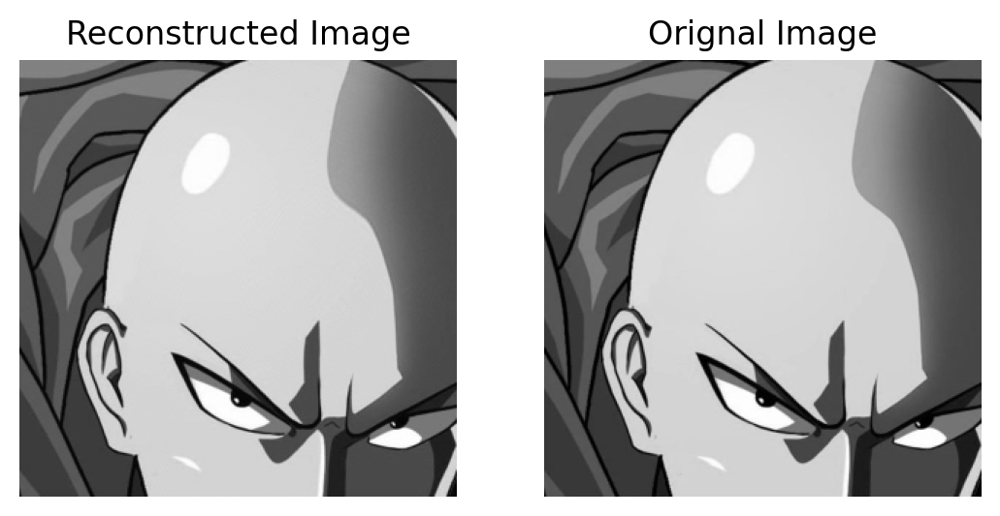

Loss: 205.05335998535156
Number of epochs 1770
Number of Features: 180
Root Mean Squared Error: 0.6833877563476562
Peak Signal to Noise Ratio: 51.43745803833008


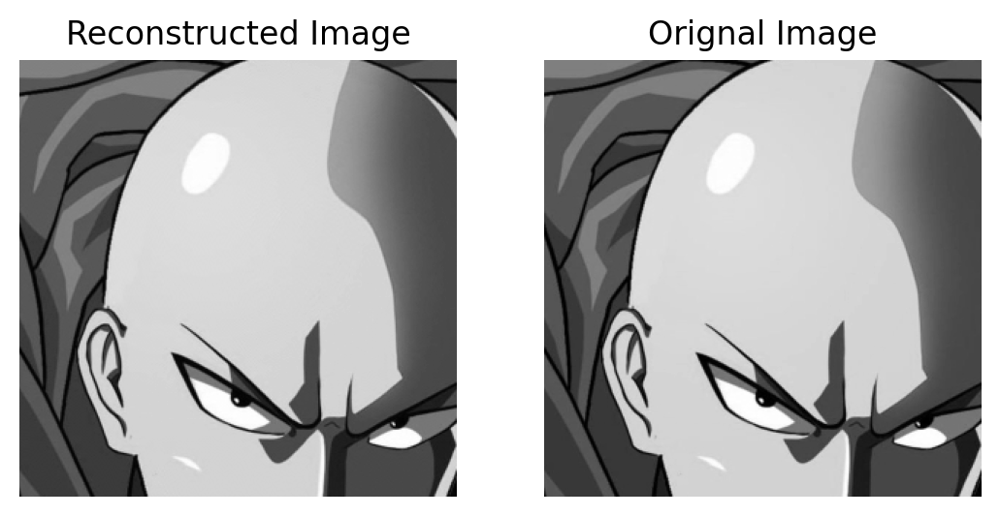

Loss: 133.4821319580078
Number of epochs 2889
Number of Features: 200
Root Mean Squared Error: 0.4449147880077362
Peak Signal to Noise Ratio: 55.16526794433594


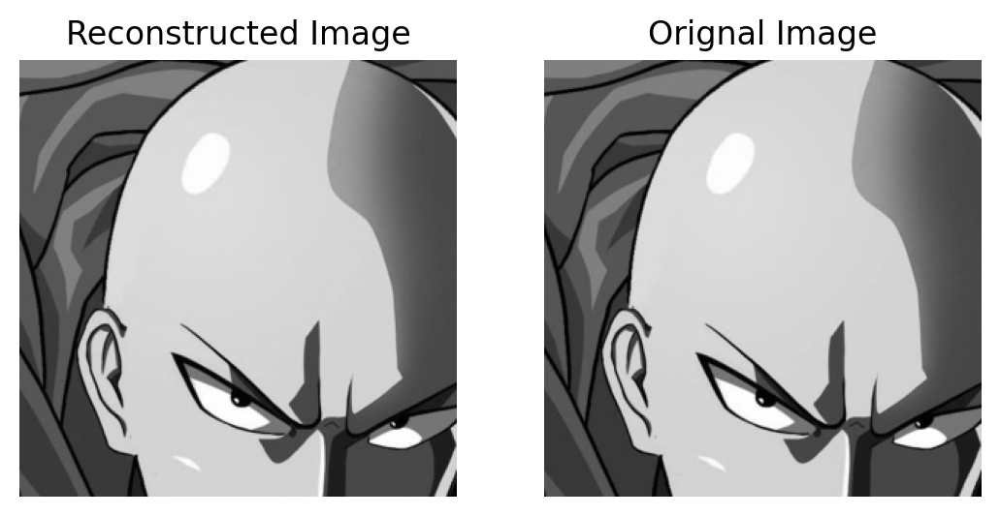

Loss: 89.66293334960938
Number of epochs 2783
Number of Features: 220
Root Mean Squared Error: 0.2988196909427643
Peak Signal to Noise Ratio: 58.62261962890625


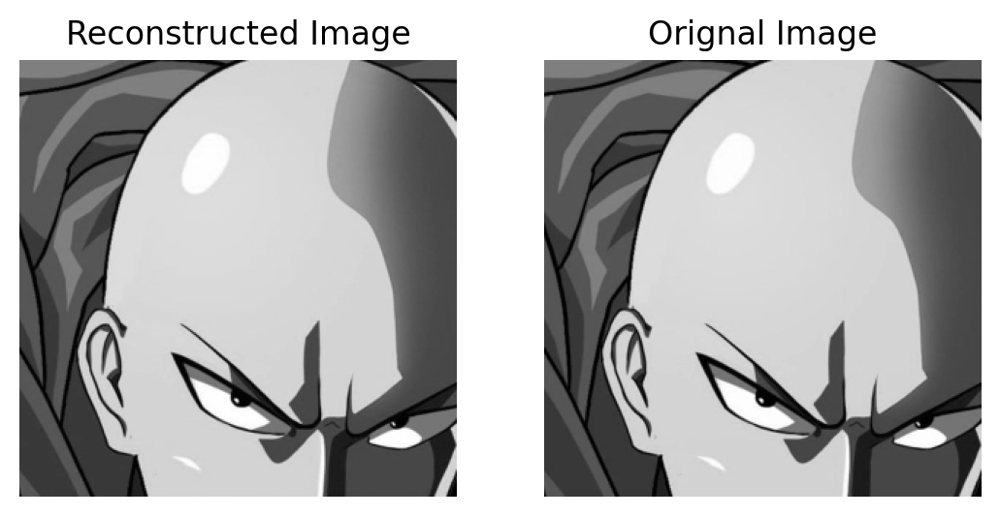

Loss: 75.4205551147461
Number of epochs 2106
Number of Features: 240
Root Mean Squared Error: 0.251292884349823
Peak Signal to Noise Ratio: 60.127201080322266


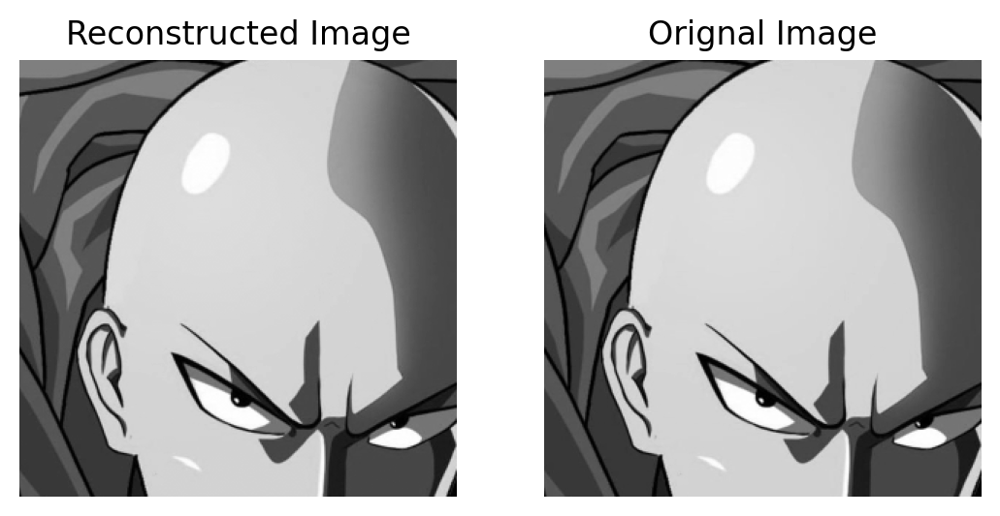

Loss: 71.4466552734375
Number of epochs 1582
Number of Features: 260
Root Mean Squared Error: 0.23797771334648132
Peak Signal to Noise Ratio: 60.600074768066406


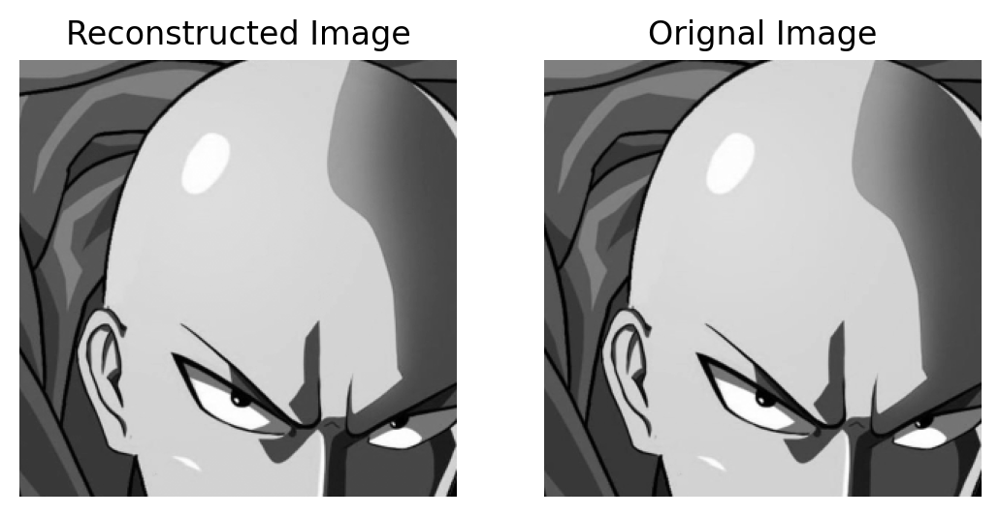

Loss: 71.24610137939453
Number of epochs 1243
Number of Features: 280
Root Mean Squared Error: 0.2372303456068039
Peak Signal to Noise Ratio: 60.62739944458008


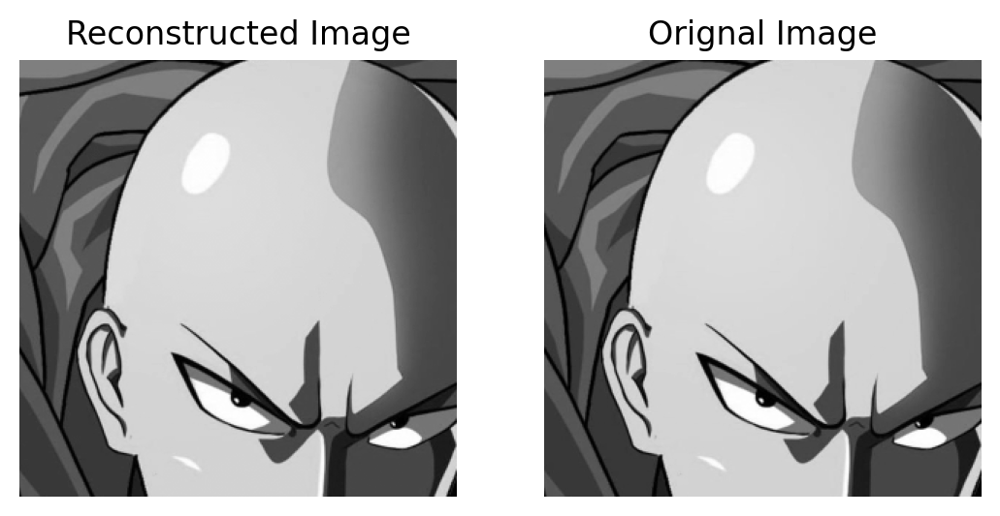

Loss: 37.621376037597656
Number of epochs 5001
Number of Features: 300
Root Mean Squared Error: 0.12488099932670593
Peak Signal to Noise Ratio: 66.20087432861328


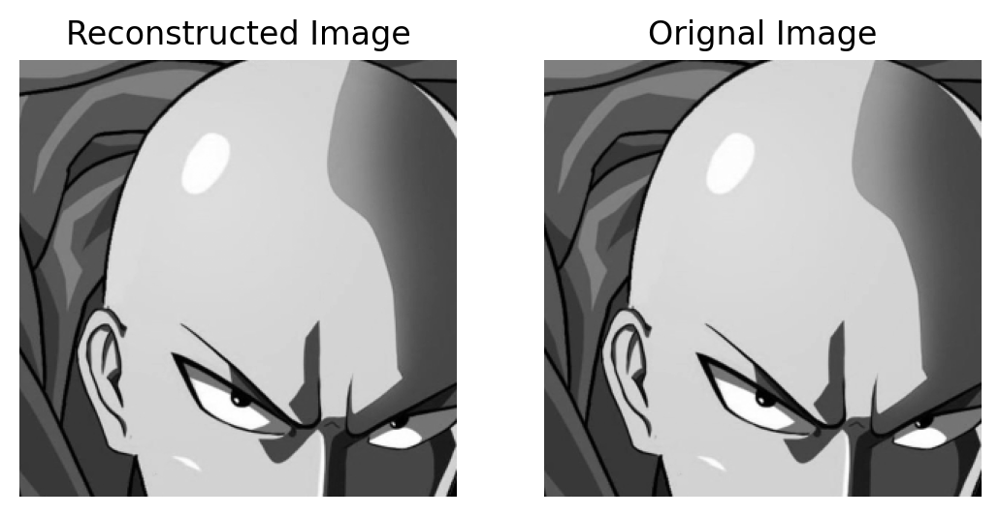

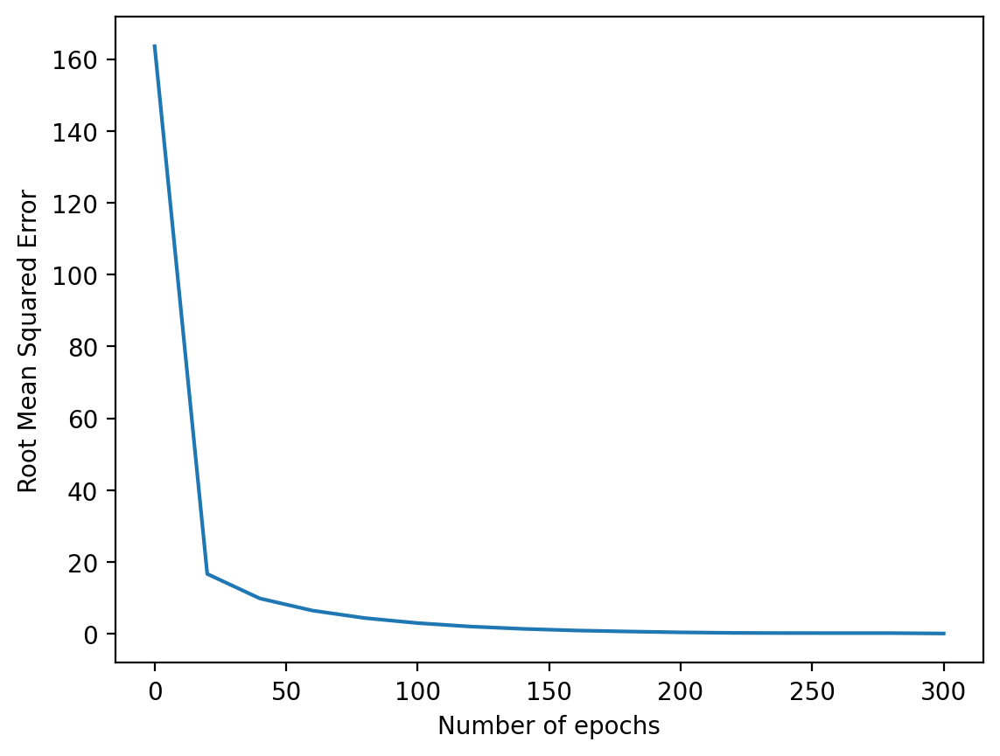

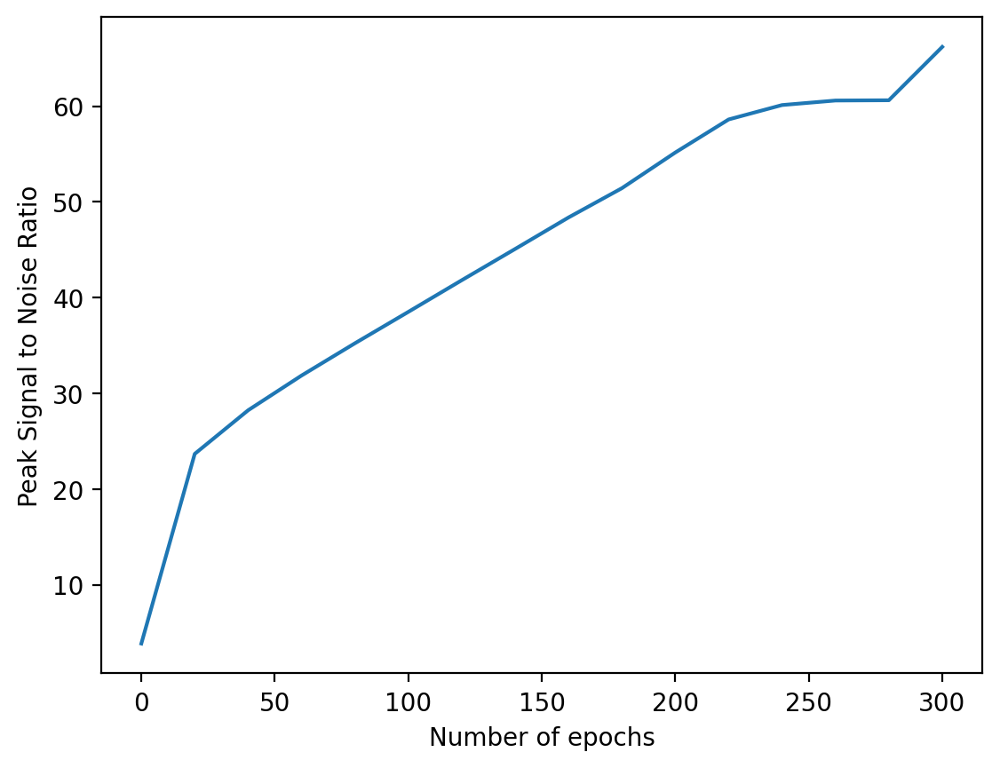

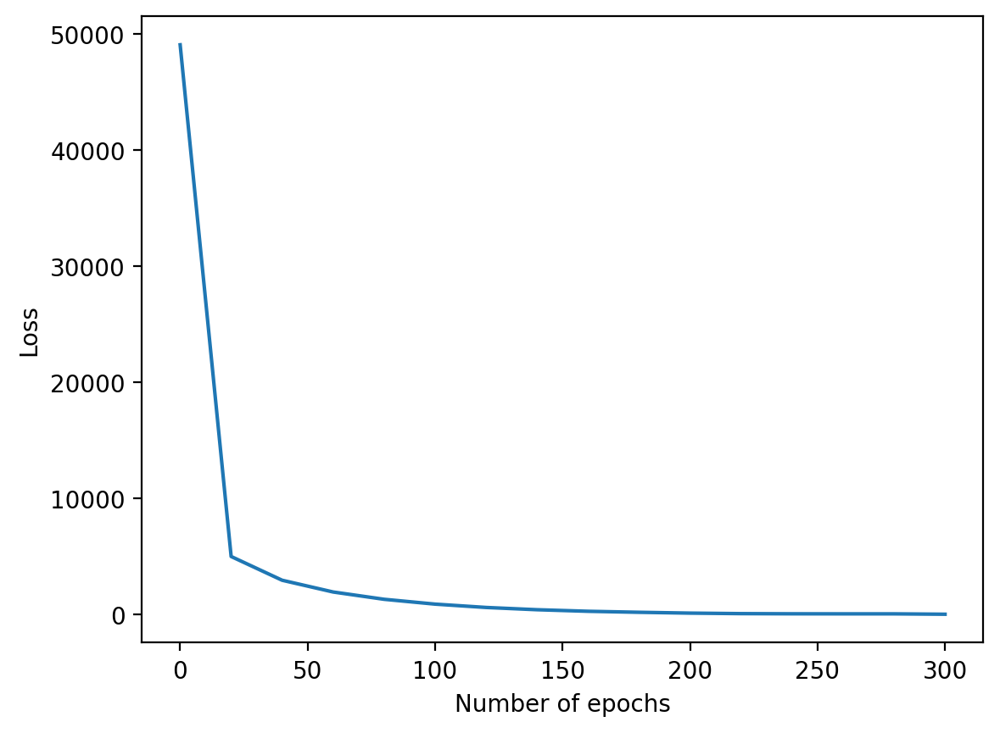

In [44]:
# Plotting and getting the results
no_features = []
rmse_l = []
psnr_l = []
loss = []
for r in range(0, 301, 20): # taking features form 0 to 301 as taking more features will just result in more overfitting.
    a, b, c= factorize(crop, r)
    rmse_l.append(a)
    psnr_l.append(b)
    loss.append(c)
    no_features.append(r)

plt.plot(no_features, rmse_l)
plt.xlabel("Number of epochs")
plt.ylabel("Root Mean Squared Error")
plt.show()
plt.plot(no_features, psnr_l)
plt.xlabel("Number of epochs")
plt.ylabel("Peak Signal to Noise Ratio")
plt.show()
plt.plot(no_features, loss)
plt.xlabel("Number of epochs")
plt.ylabel("Loss")
plt.show()

##### 2. Consider a case where 900 pixels (30x30) are randomly missing from an image. Reconstruct the image using matrix factorization, plot the reconstructed image, and calculate the RMSE and PSNR metrics. Next, reconstruct the same image with the missing pixels using Random Fourier Features (RFF) and Linear Regression. Compute the RMSE and PSNR for both methods, and compare the results to see which performs better.[3 Marks]

In [52]:
# Masking the image with NaN values for a patch

def mask_image_patch(img):
    img_copy = img.clone()
    mask = ~(img >= 0)
    a = [i for i in range(200, 230)]
    b = [i for i in range(135, 165)]
    for i in range(1, mask.shape[0]):
        for j in range(1, mask.shape[1]):
            if i in a and j in b:
                mask[i][j] = True
    img_copy[mask] = float("nan")
    return img_copy, mask
    
masked_img_patch = mask_image_patch(crop) # exactly 900 pixels can be removed
masked_img_patch[1].sum()

tensor(900)

Loss: 48832.79296875
Number of epochs 1
Number of Features: 0
Root Mean Squared Error: 163.59645080566406
Peak Signal to Noise Ratio: 3.855325698852539


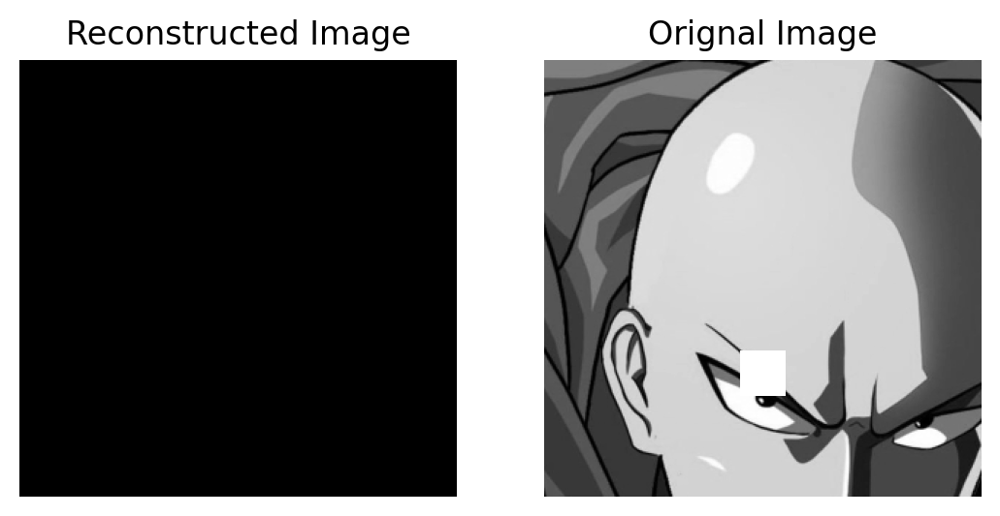

Loss: 4792.765625
Number of epochs 5001
Number of Features: 20
Root Mean Squared Error: 16.056364059448242
Peak Signal to Noise Ratio: 24.017858505249023


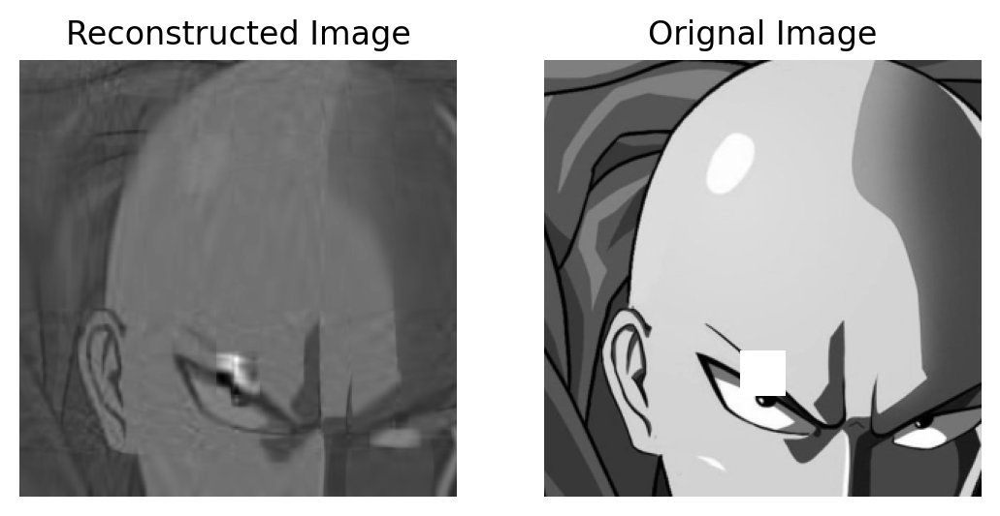

Loss: 2804.5615234375
Number of epochs 5001
Number of Features: 40
Root Mean Squared Error: 9.395631790161133
Peak Signal to Noise Ratio: 28.672285079956055


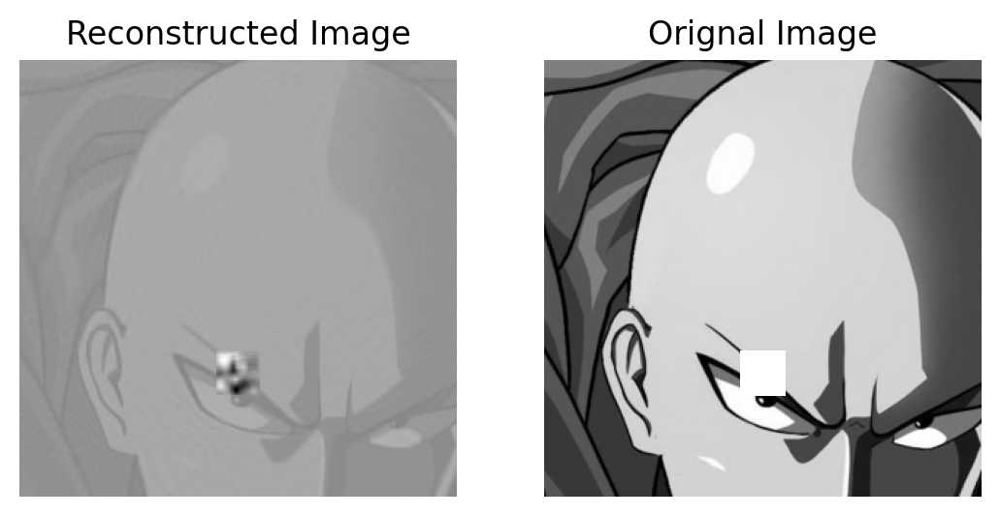

Loss: 1824.73681640625
Number of epochs 5001
Number of Features: 60
Root Mean Squared Error: 6.113091468811035
Peak Signal to Noise Ratio: 32.40558624267578


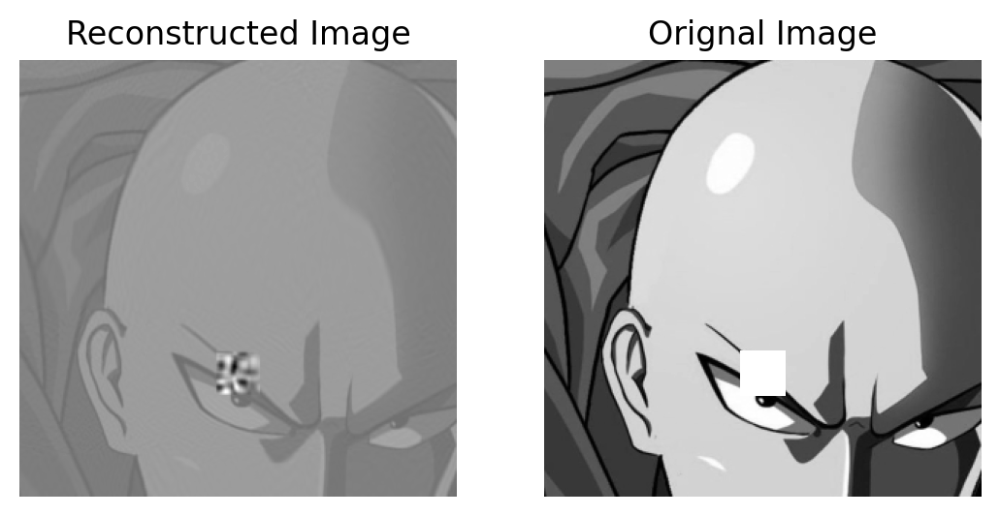

Loss: 1214.7265625
Number of epochs 4650
Number of Features: 80
Root Mean Squared Error: 4.069481372833252
Peak Signal to Noise Ratio: 35.94002151489258


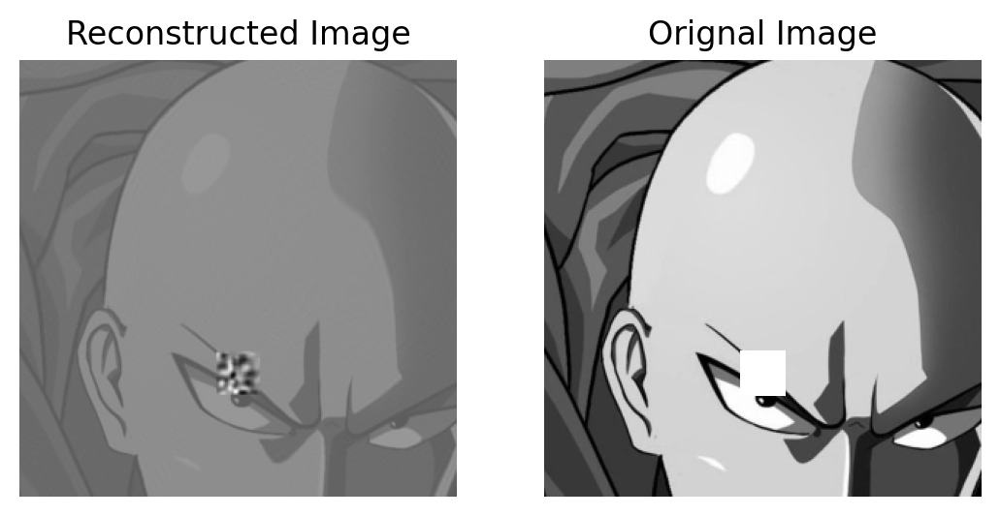

Loss: 831.2264404296875
Number of epochs 3051
Number of Features: 100
Root Mean Squared Error: 2.784731149673462
Peak Signal to Noise Ratio: 39.235137939453125


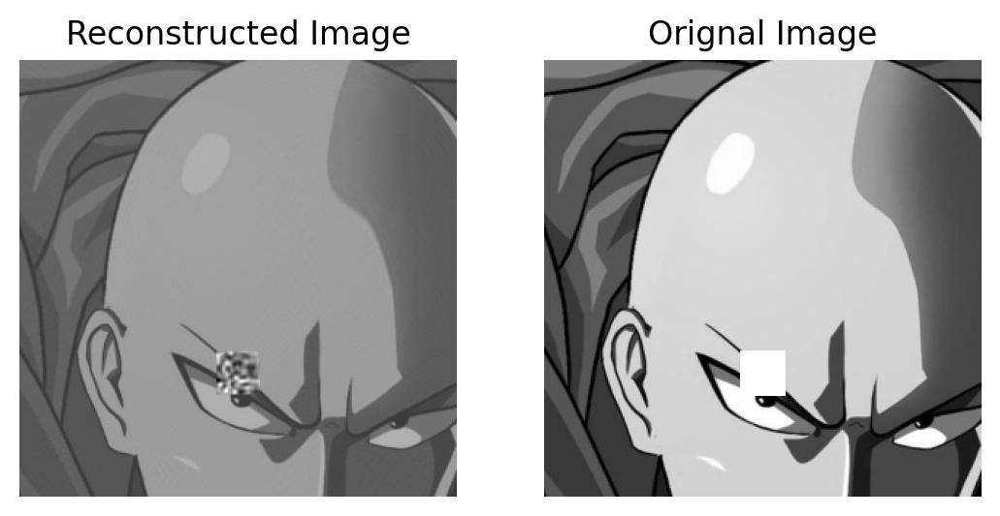

Loss: 564.6790771484375
Number of epochs 2273
Number of Features: 120
Root Mean Squared Error: 1.891765832901001
Peak Signal to Noise Ratio: 42.59345626831055


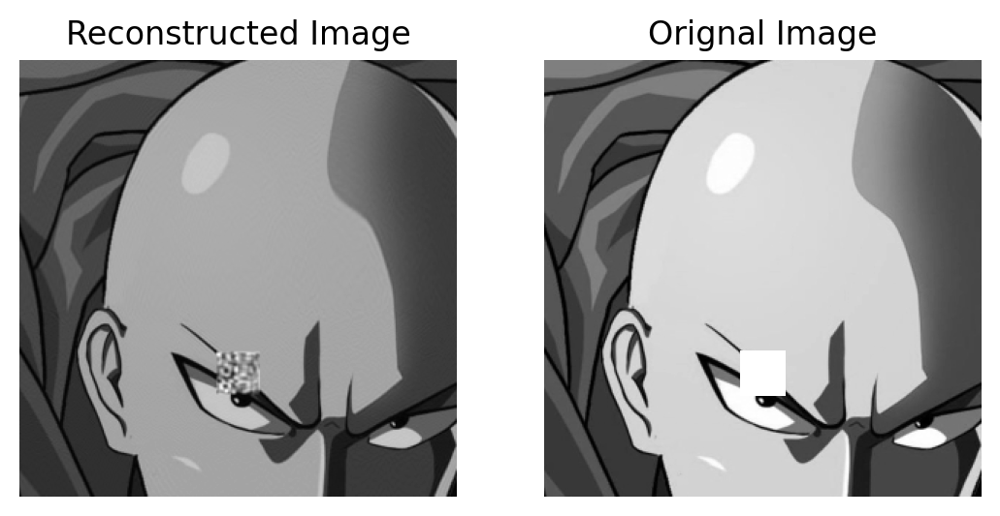

Loss: 392.0265197753906
Number of epochs 1714
Number of Features: 140
Root Mean Squared Error: 1.3133575916290283
Peak Signal to Noise Ratio: 45.763145446777344


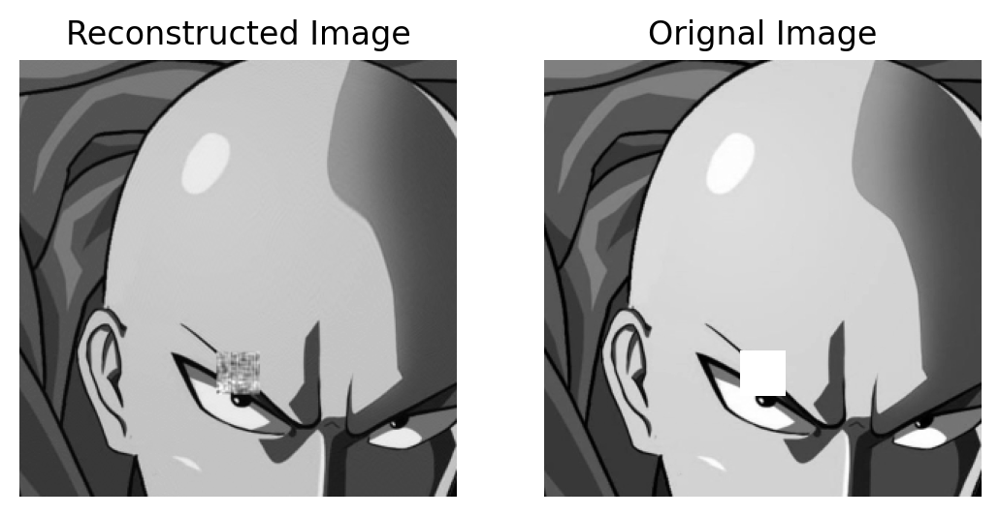

Loss: 257.9931335449219
Number of epochs 2692
Number of Features: 160
Root Mean Squared Error: 0.8643210530281067
Peak Signal to Noise Ratio: 49.397300720214844


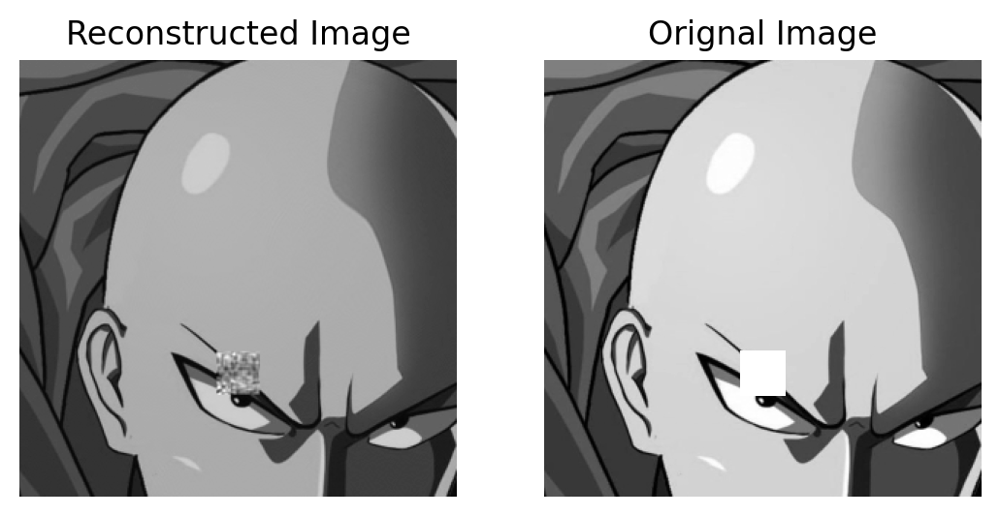

Loss: 171.52723693847656
Number of epochs 3243
Number of Features: 180
Root Mean Squared Error: 0.5746210217475891
Peak Signal to Noise Ratio: 52.943172454833984


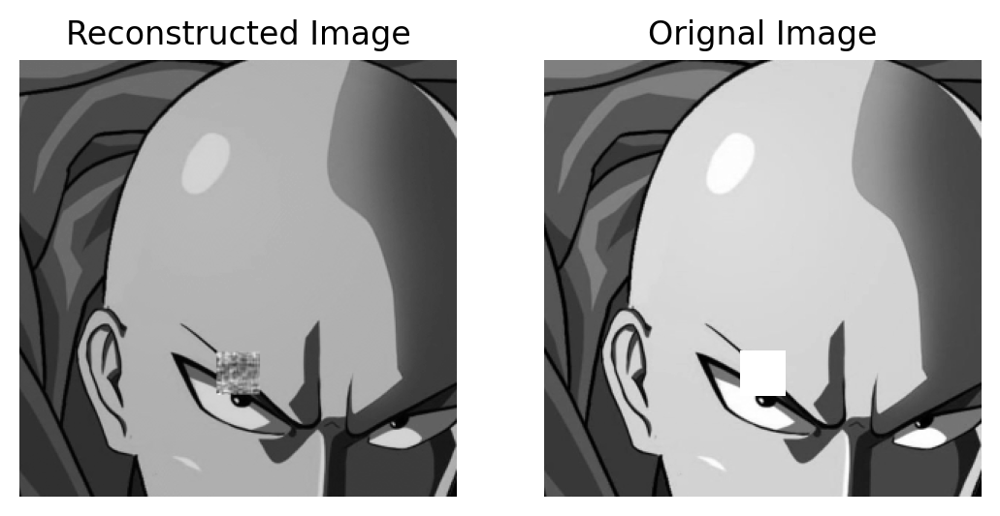

Loss: 113.64898681640625
Number of epochs 2977
Number of Features: 200
Root Mean Squared Error: 0.3807069659233093
Peak Signal to Noise Ratio: 56.51898956298828


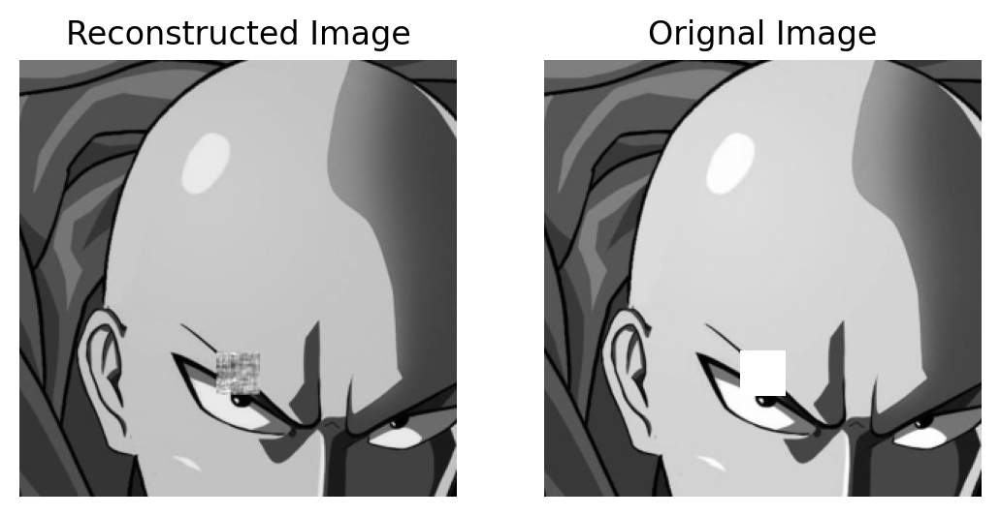

Loss: 80.95881652832031
Number of epochs 2571
Number of Features: 220
Root Mean Squared Error: 0.27115148305892944
Peak Signal to Noise Ratio: 59.46656036376953


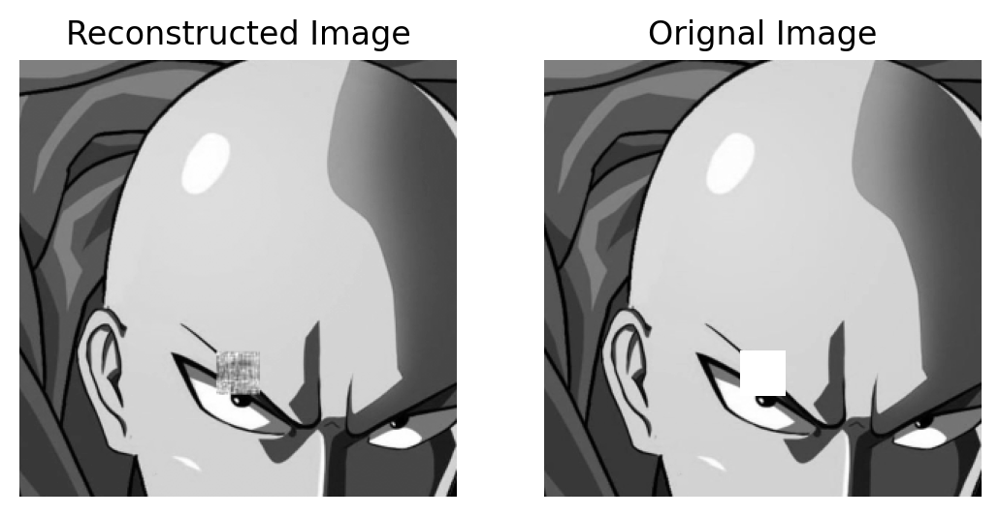

Loss: 72.18054962158203
Number of epochs 2004
Number of Features: 240
Root Mean Squared Error: 0.24169455468654633
Peak Signal to Noise Ratio: 60.4654655456543


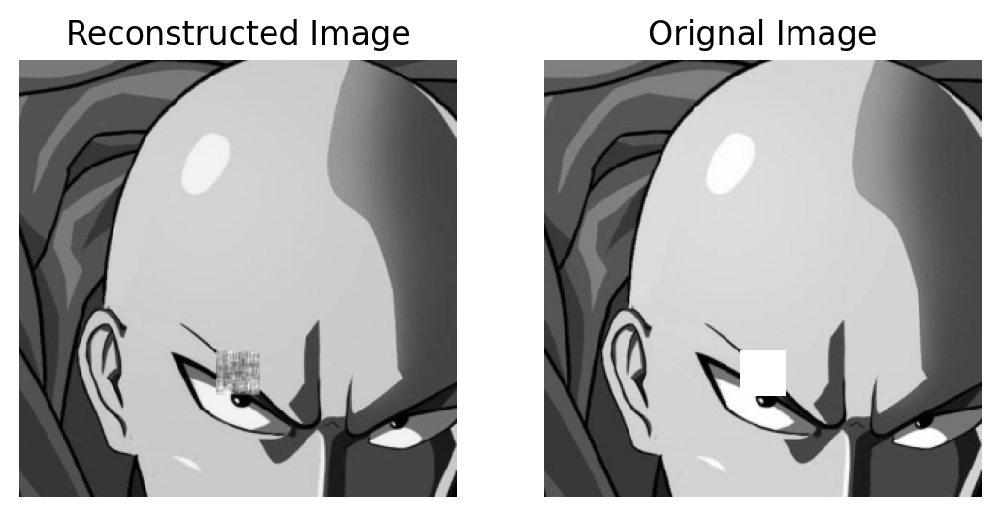

Loss: 70.36721801757812
Number of epochs 1490
Number of Features: 260
Root Mean Squared Error: 0.23555083572864532
Peak Signal to Noise Ratio: 60.689109802246094


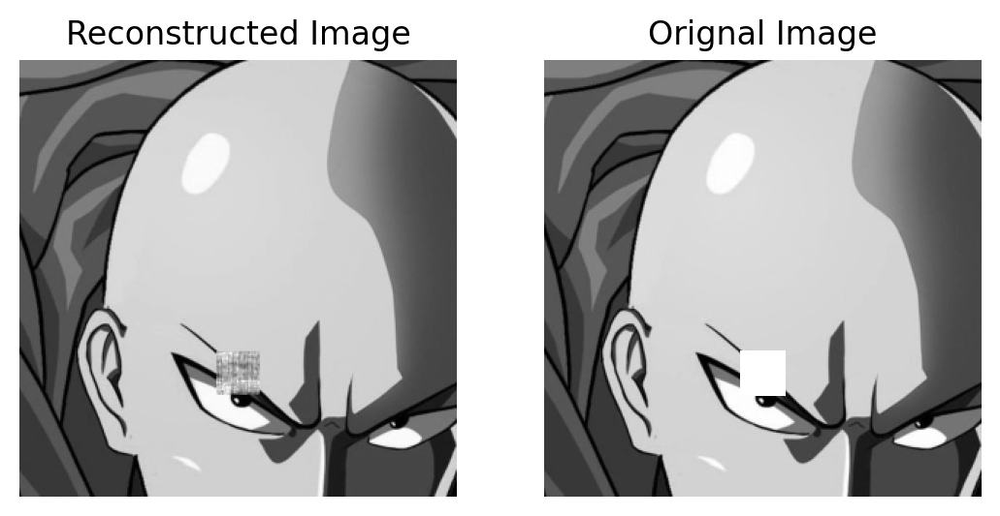

Loss: 70.29991149902344
Number of epochs 1209
Number of Features: 280
Root Mean Squared Error: 0.23524099588394165
Peak Signal to Noise Ratio: 60.70054626464844


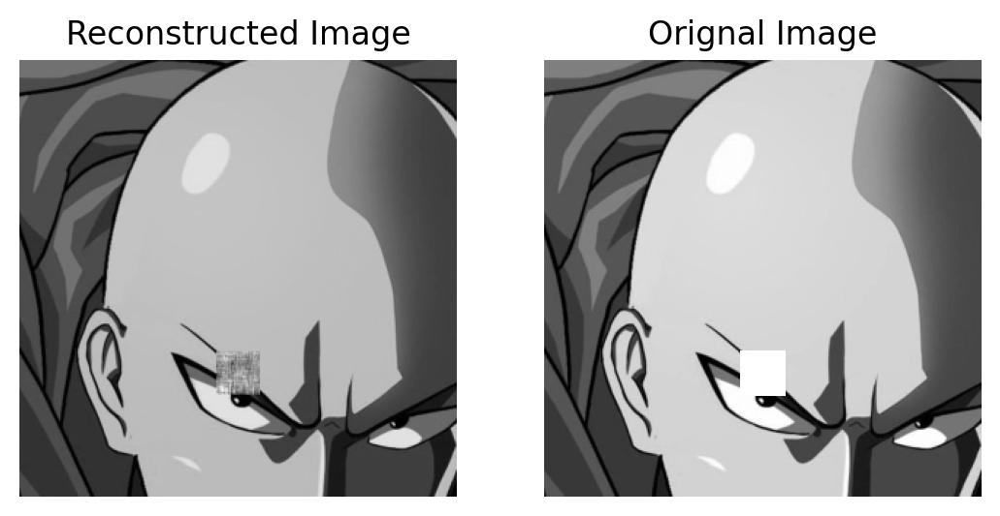

Loss: 36.8026123046875
Number of epochs 5001
Number of Features: 300
Root Mean Squared Error: 0.12387537211179733
Peak Signal to Noise Ratio: 66.27110290527344


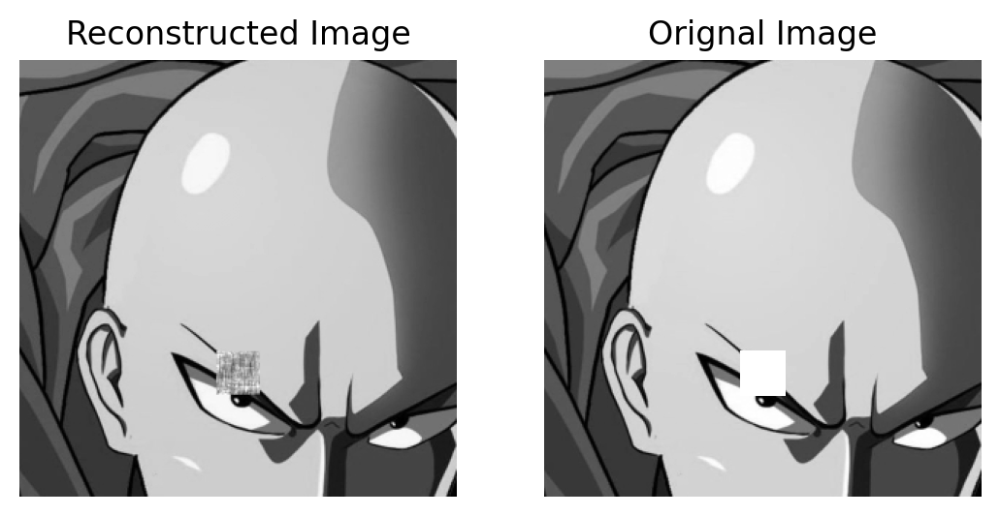

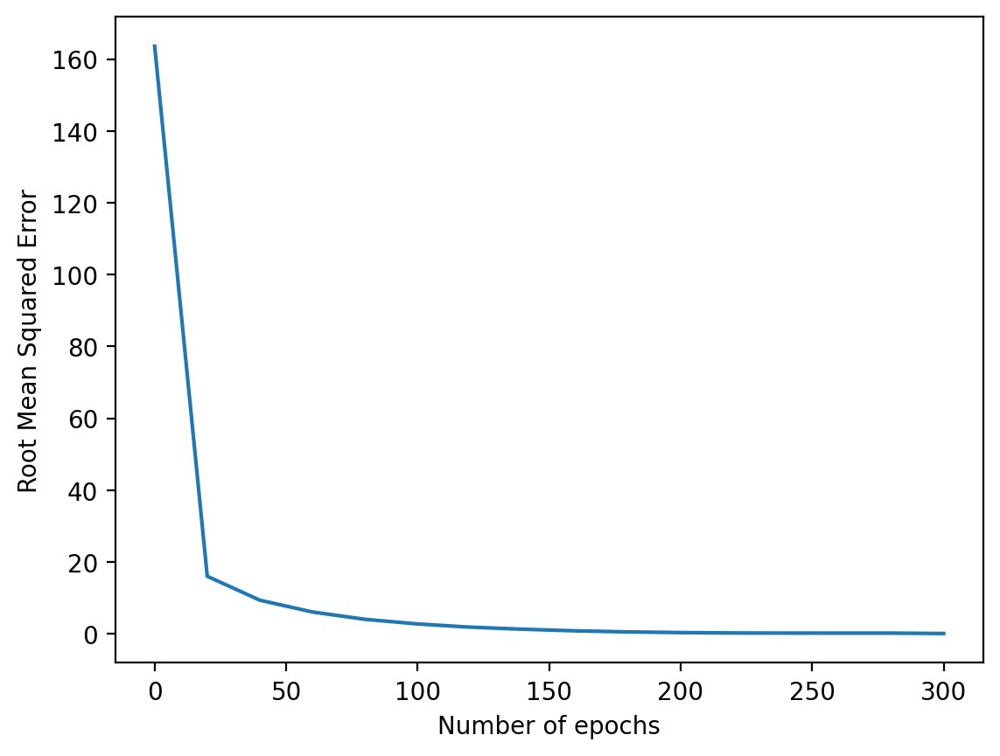

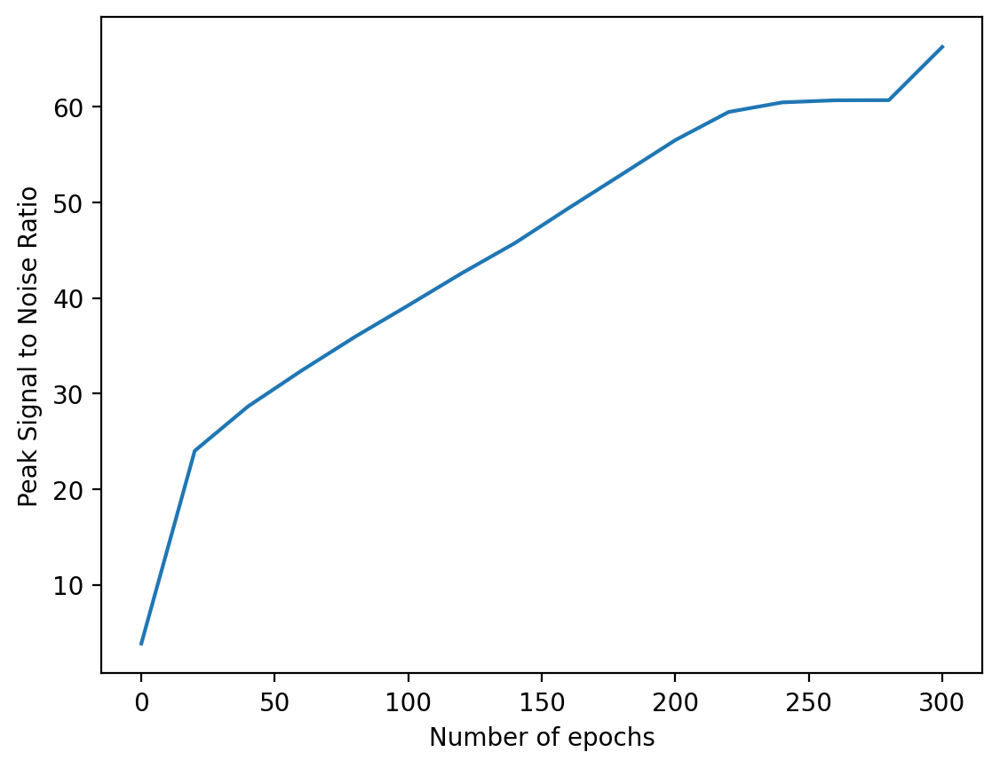

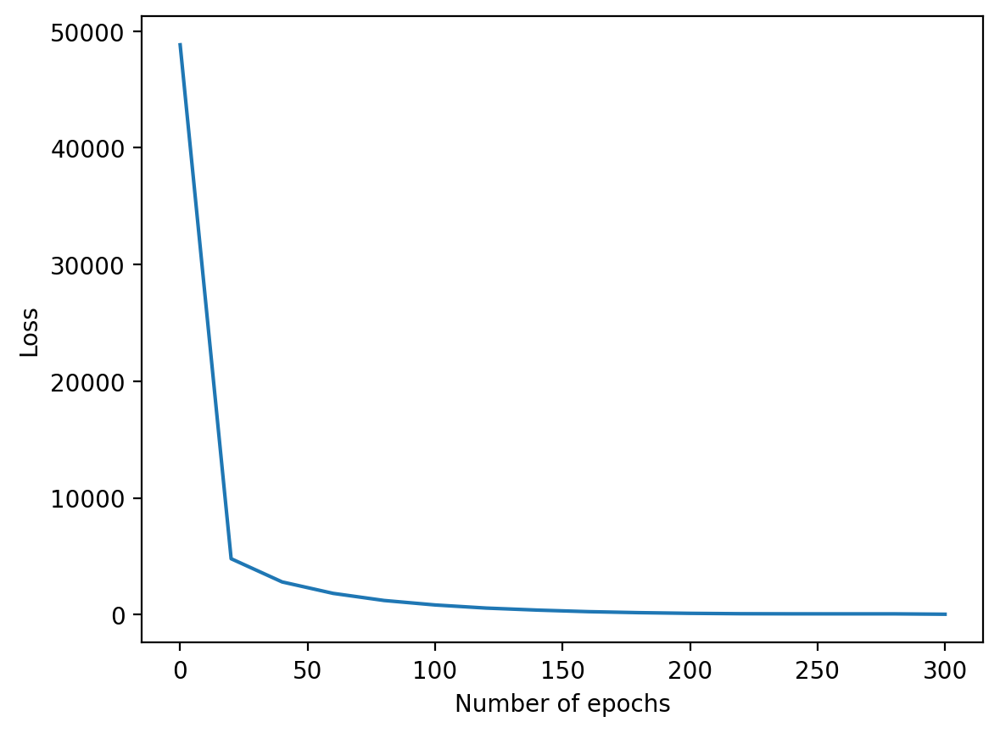

In [53]:
no_features = []
rmse_l = []
psnr_l = []
loss = []
for i in range(0, 301, 20):
    a, b, c= factorize(masked_img_patch[0], i)
    rmse_l.append(a)
    psnr_l.append(b)
    loss.append(c)
    no_features.append(i)

plt.plot(no_features, rmse_l)
plt.xlabel("Number of epochs")
plt.ylabel("Root Mean Squared Error")
plt.show()
plt.plot(no_features, psnr_l)
plt.xlabel("Number of epochs")
plt.ylabel("Peak Signal to Noise Ratio")
plt.show()
plt.plot(no_features, loss)
plt.xlabel("Number of epochs")
plt.ylabel("Loss")
plt.show()

In [57]:
# Mask the image with NaN values randomly 
def mask_image(img, prop):
    img_copy = img.clone()
    mask = torch.rand(img.shape) < prop
    img_copy[mask] = float('nan') # aij where maskij is true nan is substituted
    return img_copy, mask

masked_img = mask_image(crop, 0.01) # exactly 900 pixels can't be removed
masked_img[1].sum()

tensor(863)

Loss: 48843.9375
Number of epochs 1
Number of Features: 0
Root Mean Squared Error: 163.5997772216797
Peak Signal to Noise Ratio: 3.855149984359741


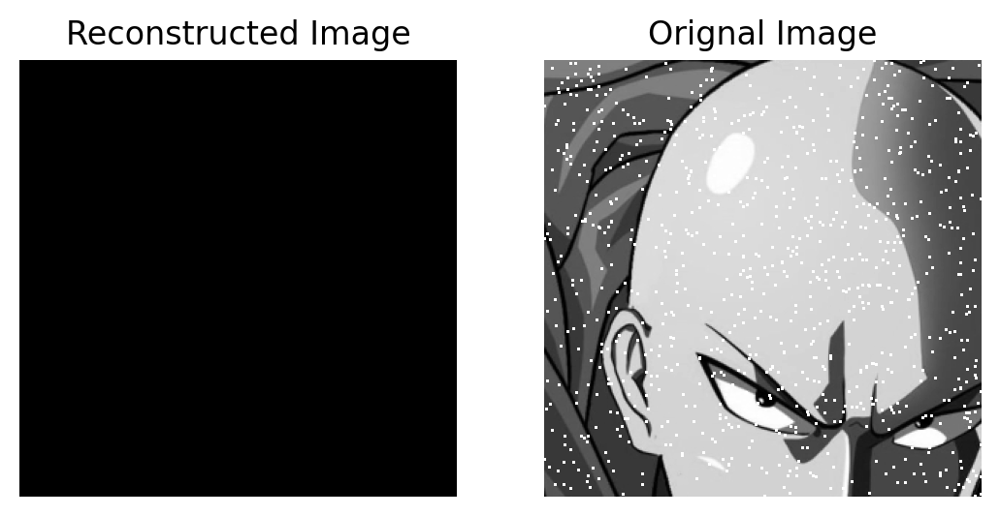

Loss: 4982.654296875
Number of epochs 3979
Number of Features: 20
Root Mean Squared Error: 16.689048767089844
Peak Signal to Noise Ratio: 23.682172775268555


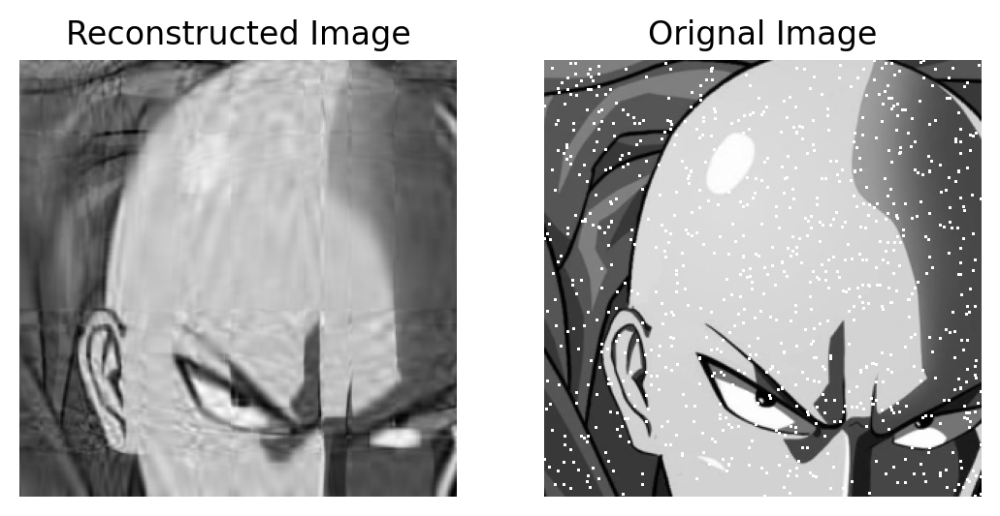

Loss: 2944.3740234375
Number of epochs 2566
Number of Features: 40
Root Mean Squared Error: 9.861971855163574
Peak Signal to Noise Ratio: 28.251529693603516


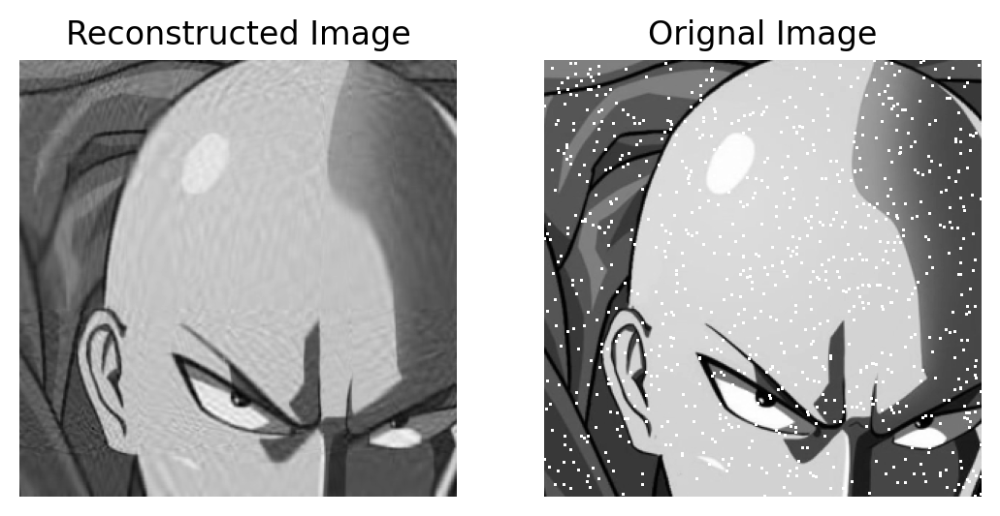

Loss: 1937.5645751953125
Number of epochs 2808
Number of Features: 60
Root Mean Squared Error: 6.4897332191467285
Peak Signal to Noise Ratio: 31.886268615722656


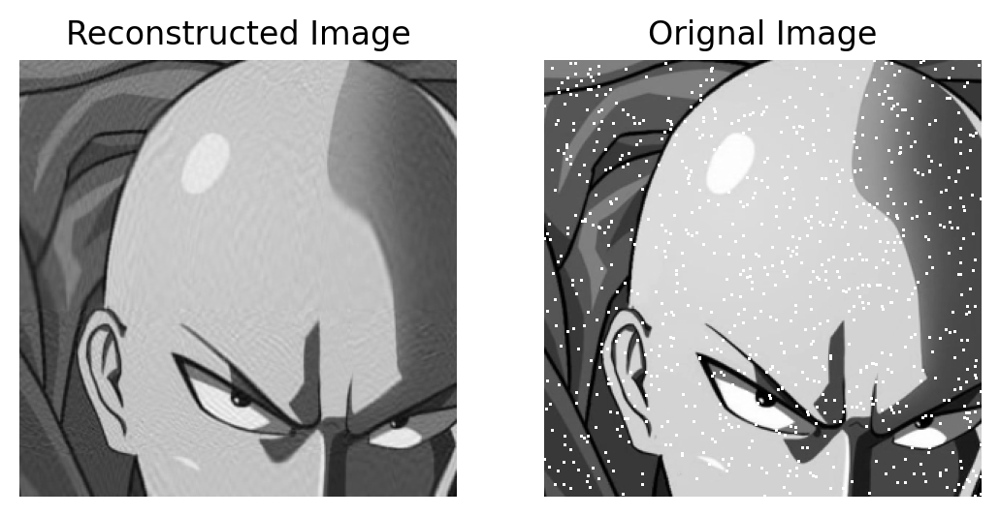

Loss: 1310.00390625
Number of epochs 2492
Number of Features: 80
Root Mean Squared Error: 4.3877644538879395
Peak Signal to Noise Ratio: 35.28593826293945


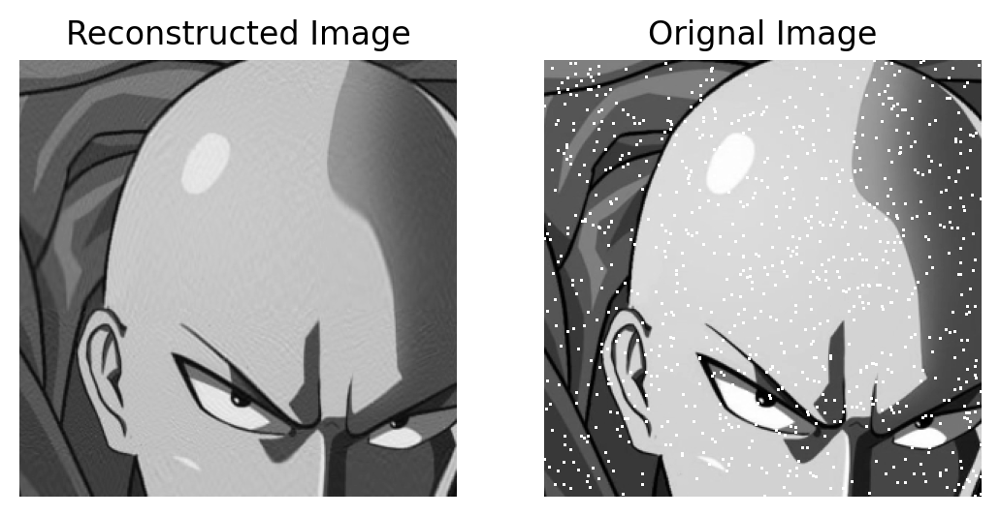

Loss: 894.414306640625
Number of epochs 3152
Number of Features: 100
Root Mean Squared Error: 2.995783567428589
Peak Signal to Noise Ratio: 38.60059356689453


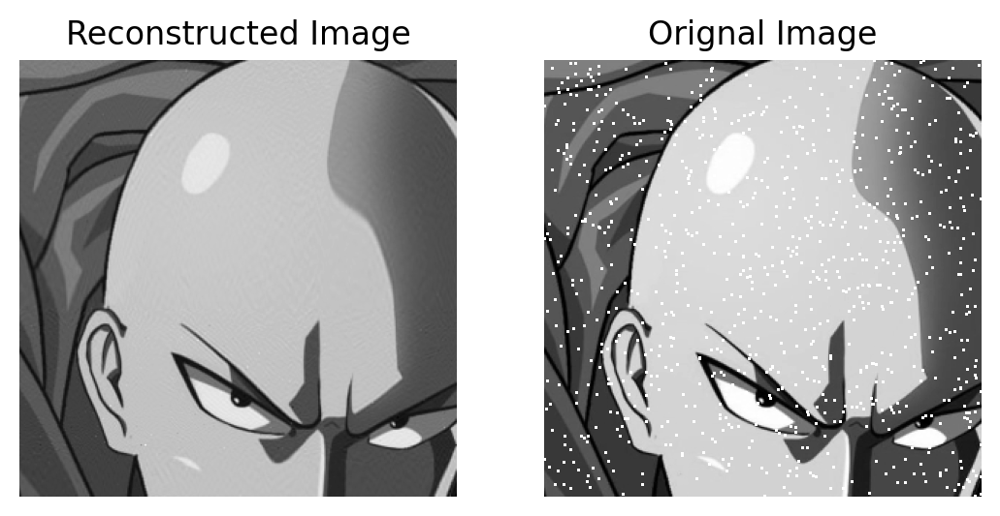

Loss: 607.6195068359375
Number of epochs 1928
Number of Features: 120
Root Mean Squared Error: 2.03518009185791
Peak Signal to Noise Ratio: 41.95874786376953


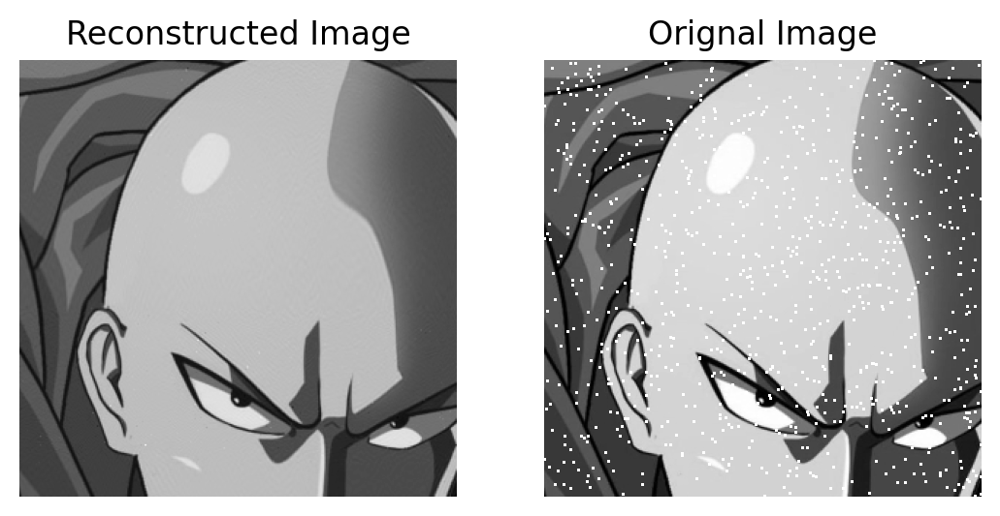

Loss: 410.6160888671875
Number of epochs 2306
Number of Features: 140
Root Mean Squared Error: 1.3753328323364258
Peak Signal to Noise Ratio: 45.362648010253906


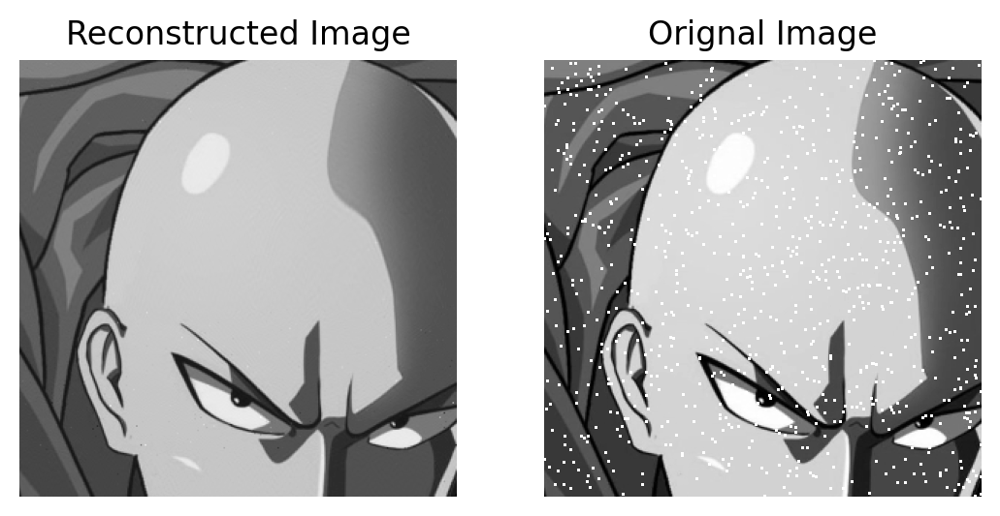

Loss: 282.84429931640625
Number of epochs 1540
Number of Features: 160
Root Mean Squared Error: 0.9474125504493713
Peak Signal to Noise Ratio: 48.60002136230469


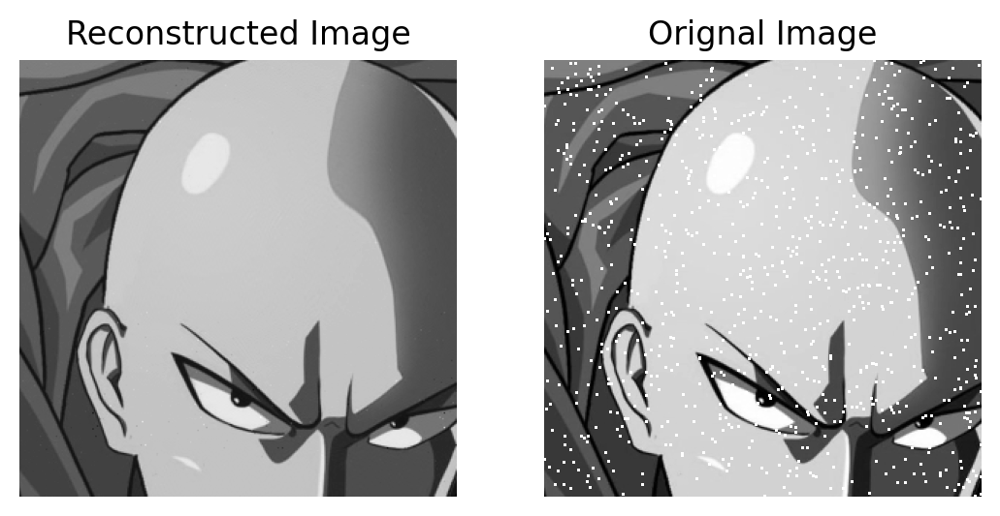

Loss: 191.92910766601562
Number of epochs 1703
Number of Features: 180
Root Mean Squared Error: 0.6428408622741699
Peak Signal to Noise Ratio: 51.96873474121094


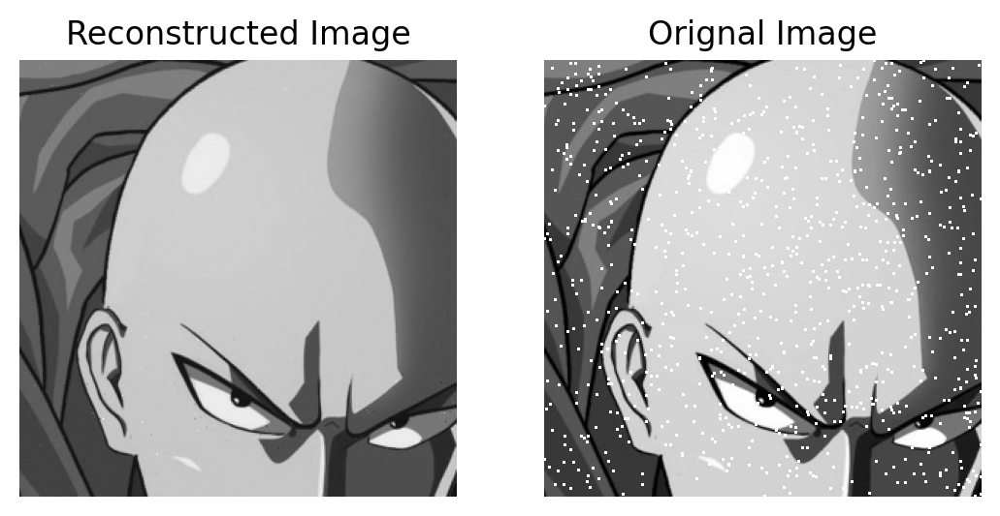

Loss: 116.90100860595703
Number of epochs 3186
Number of Features: 200
Root Mean Squared Error: 0.3915211856365204
Peak Signal to Noise Ratio: 56.27569580078125


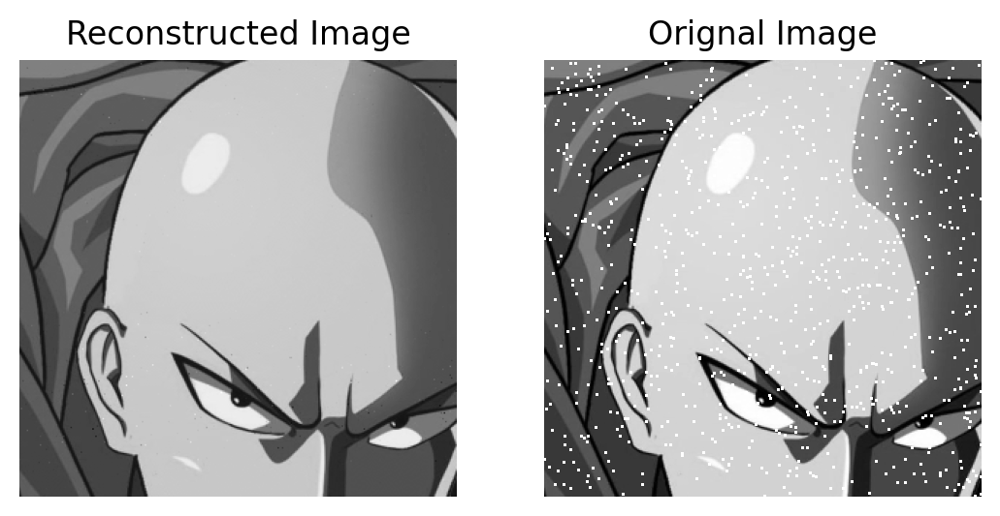

Loss: 82.6358413696289
Number of epochs 2766
Number of Features: 220
Root Mean Squared Error: 0.2767152488231659
Peak Signal to Noise Ratio: 59.29014205932617


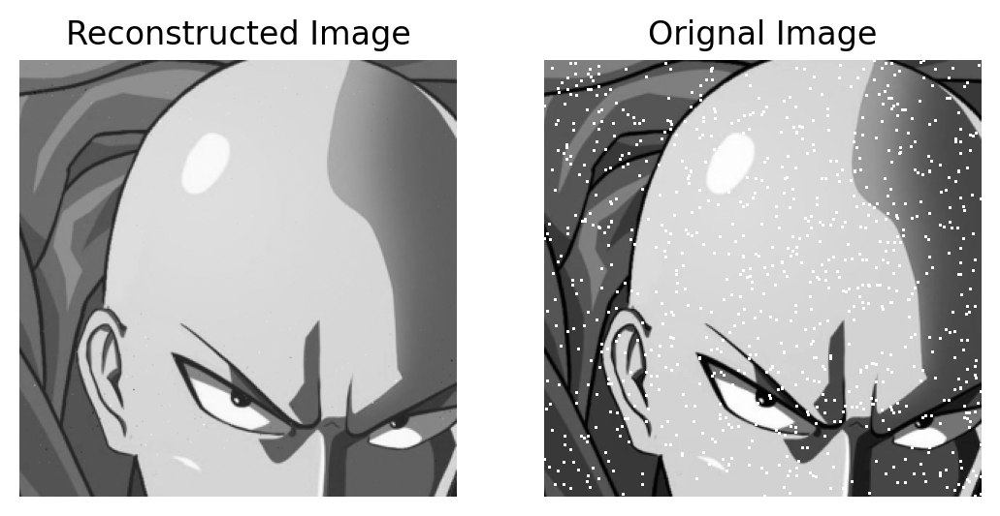

Loss: 72.75090026855469
Number of epochs 1959
Number of Features: 240
Root Mean Squared Error: 0.24355019629001617
Peak Signal to Noise Ratio: 60.3990364074707


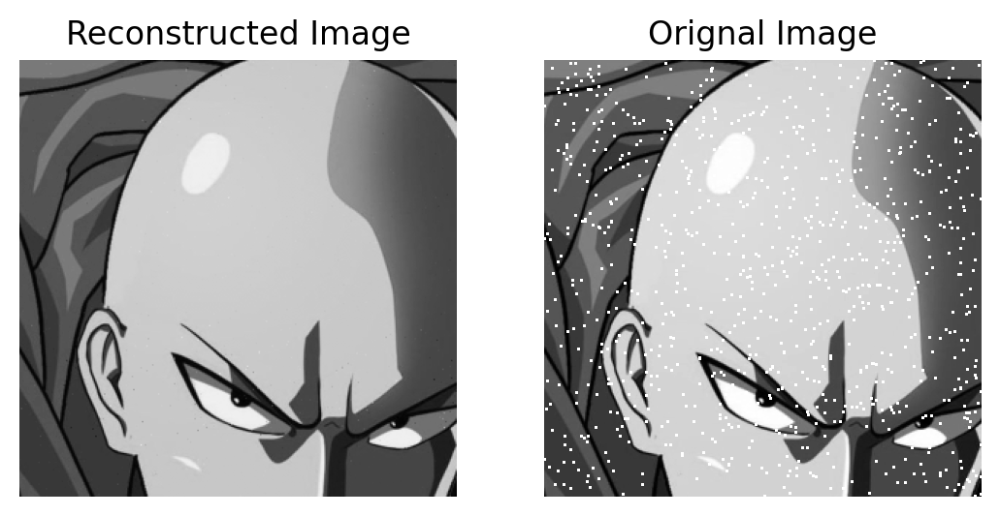

Loss: 69.66382598876953
Number of epochs 1465
Number of Features: 260
Root Mean Squared Error: 0.23312796652317047
Peak Signal to Noise Ratio: 60.7789192199707


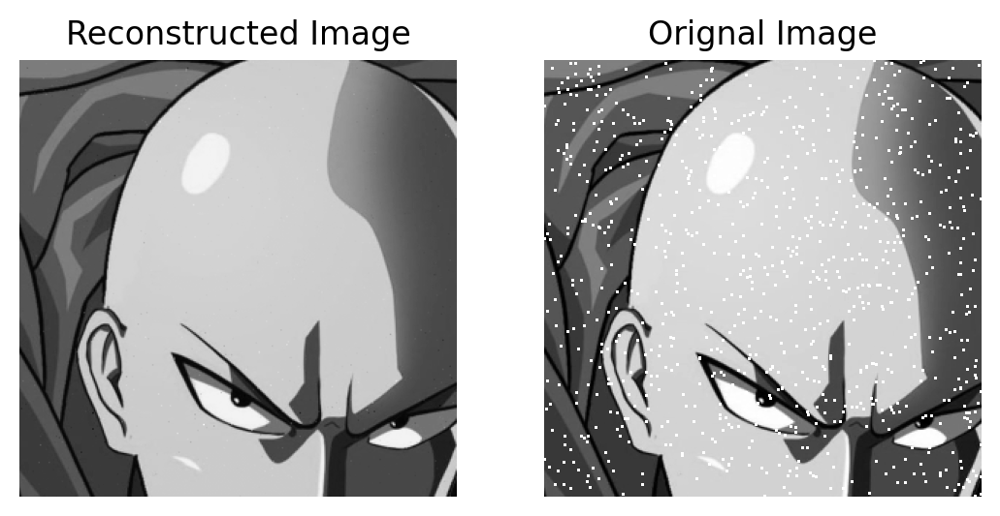

Loss: 69.9075927734375
Number of epochs 1162
Number of Features: 280
Root Mean Squared Error: 0.2338506430387497
Peak Signal to Noise Ratio: 60.75203323364258


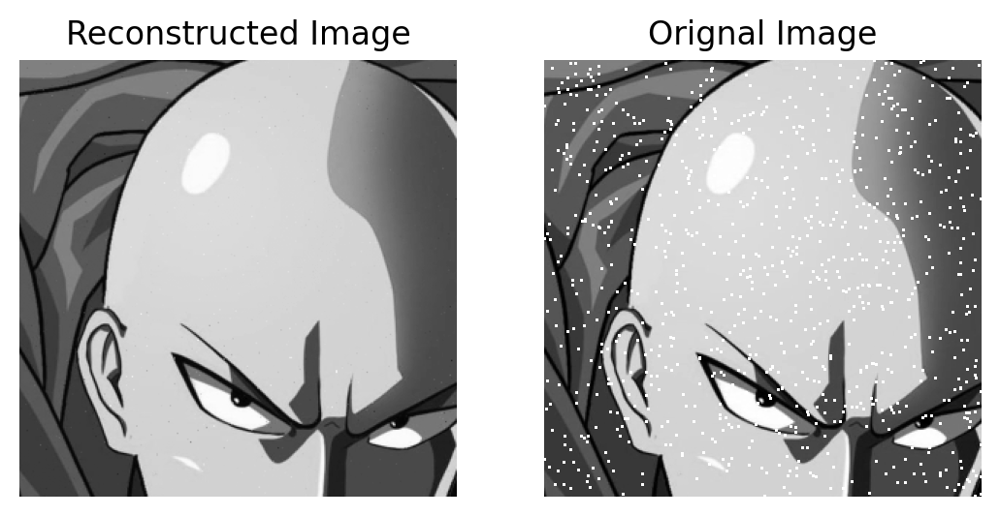

Loss: 35.808780670166016
Number of epochs 5001
Number of Features: 300
Root Mean Squared Error: 0.1188783198595047
Peak Signal to Noise Ratio: 66.62875366210938


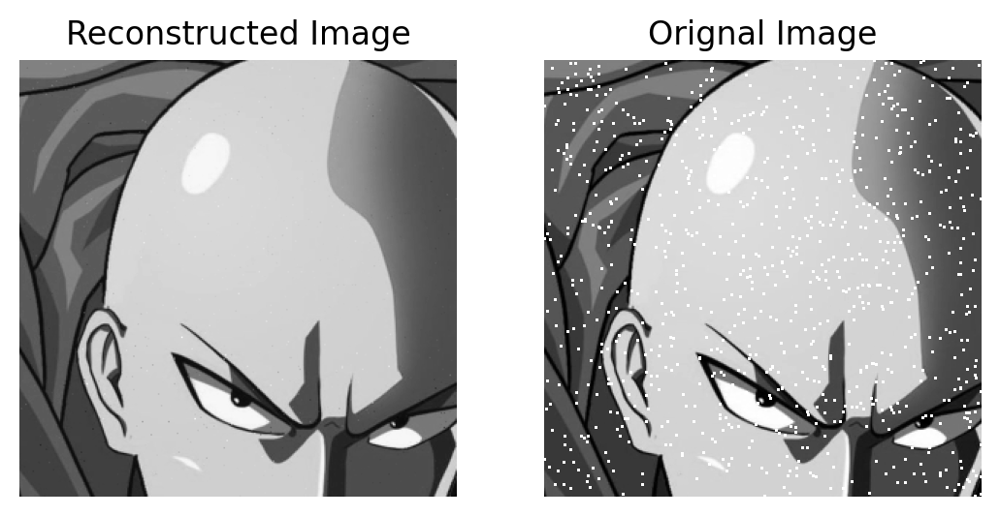

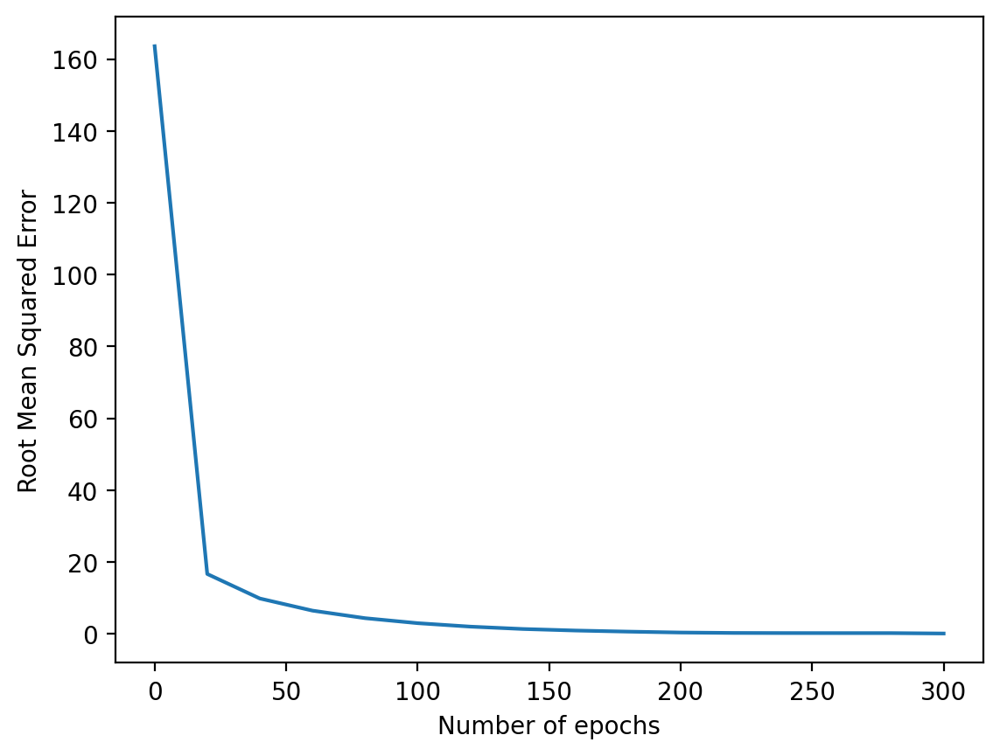

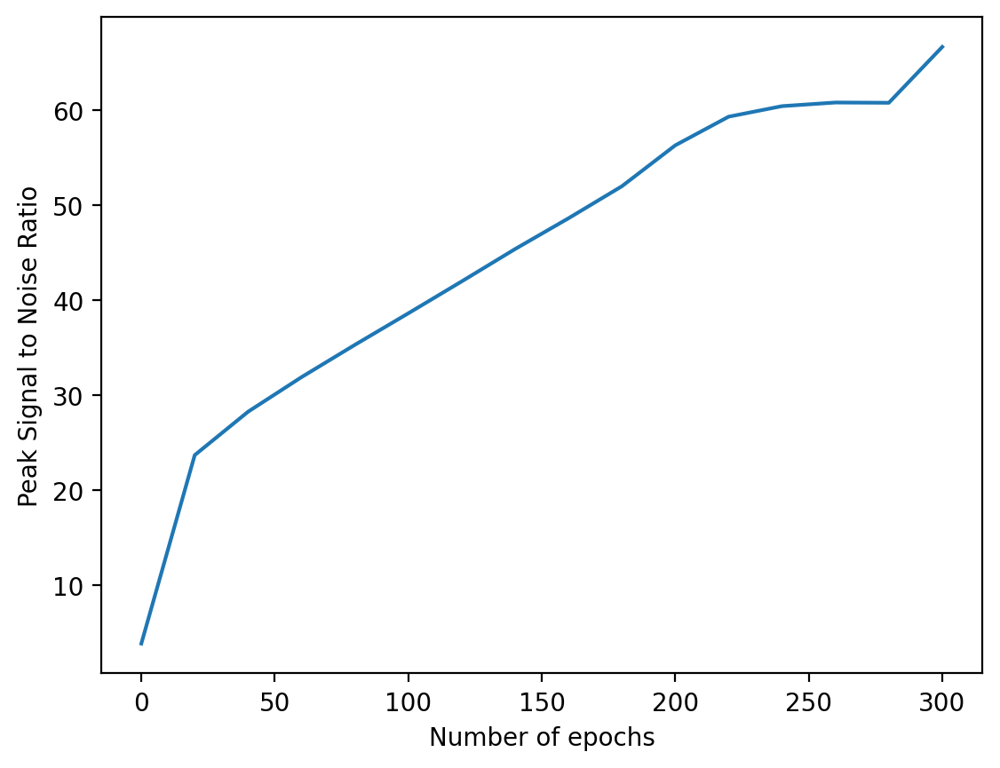

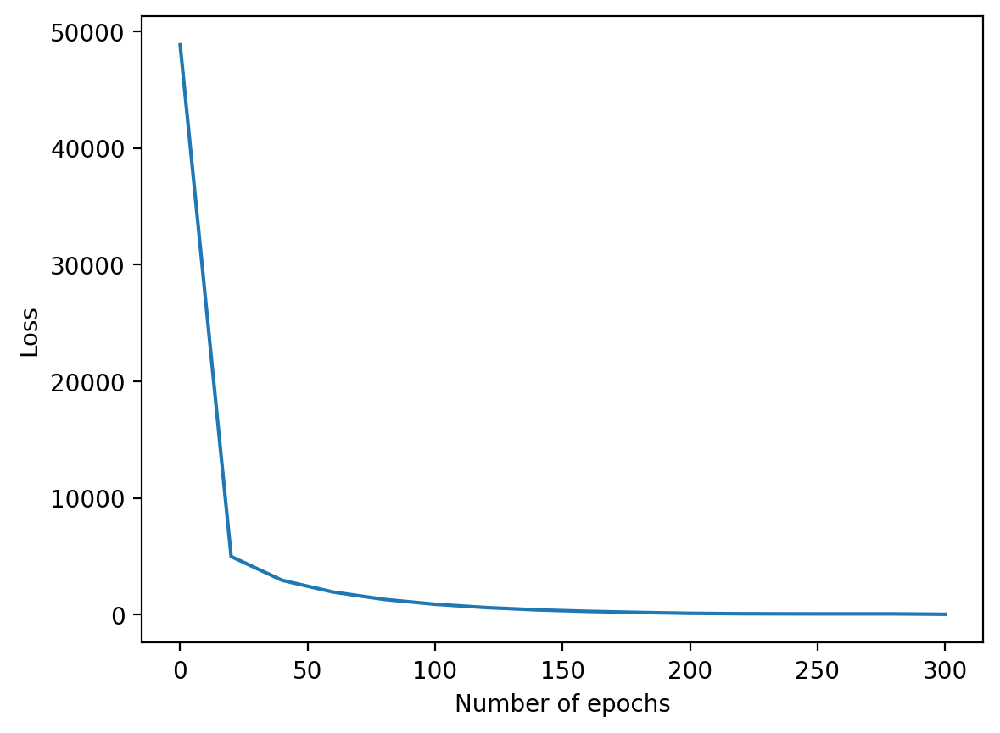

In [58]:
no_features = []
rmse_l = []
psnr_l = []
loss = []
for i in range(0, 301, 20):
    a, b, c= factorize(masked_img[0], i)
    rmse_l.append(a)
    psnr_l.append(b)
    loss.append(c)
    no_features.append(i)

plt.plot(no_features, rmse_l)
plt.xlabel("Number of epochs")
plt.ylabel("Root Mean Squared Error")
plt.show()
plt.plot(no_features, psnr_l)
plt.xlabel("Number of epochs")
plt.ylabel("Peak Signal to Noise Ratio")
plt.show()
plt.plot(no_features, loss)
plt.xlabel("Number of epochs")
plt.ylabel("Loss")
plt.show()

#### Task 5 : Image Compression using Matrix Factorisation [3 Marks]

In [13]:
patch = torchvision.transforms.functional.crop(img, 210, 1050, 50, 50)
patch.shape

torch.Size([50, 50])

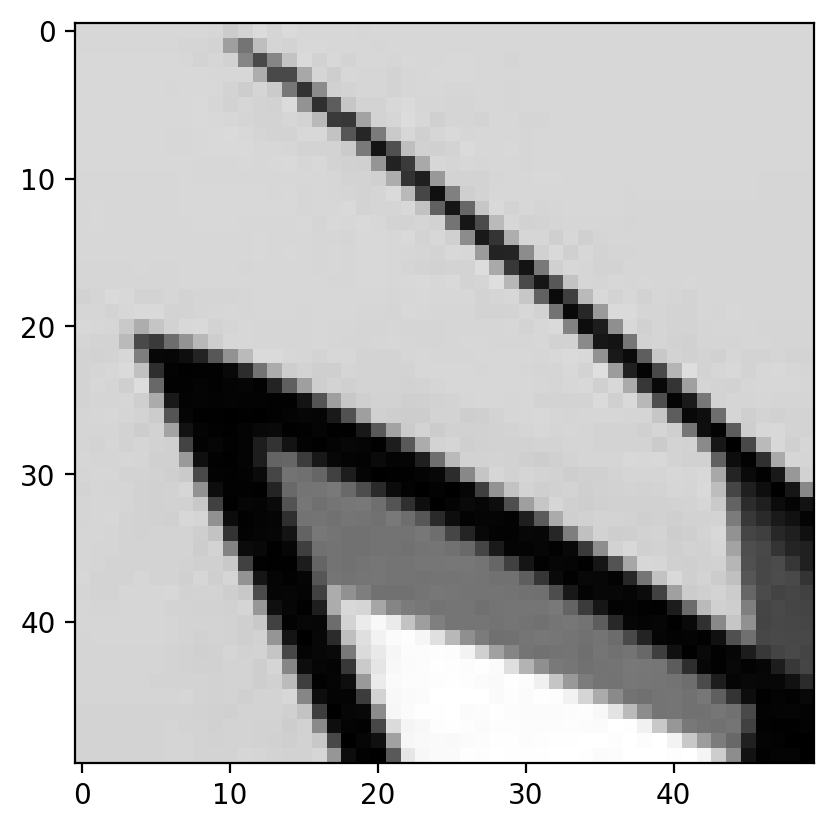

In [14]:
plt.imshow(patch, cmap='gray')

Loss: 1614.83447265625
Number of epochs 3262
Number of Features: 5
Root Mean Squared Error: 32.29667663574219
Peak Signal to Noise Ratio: 17.947647094726562


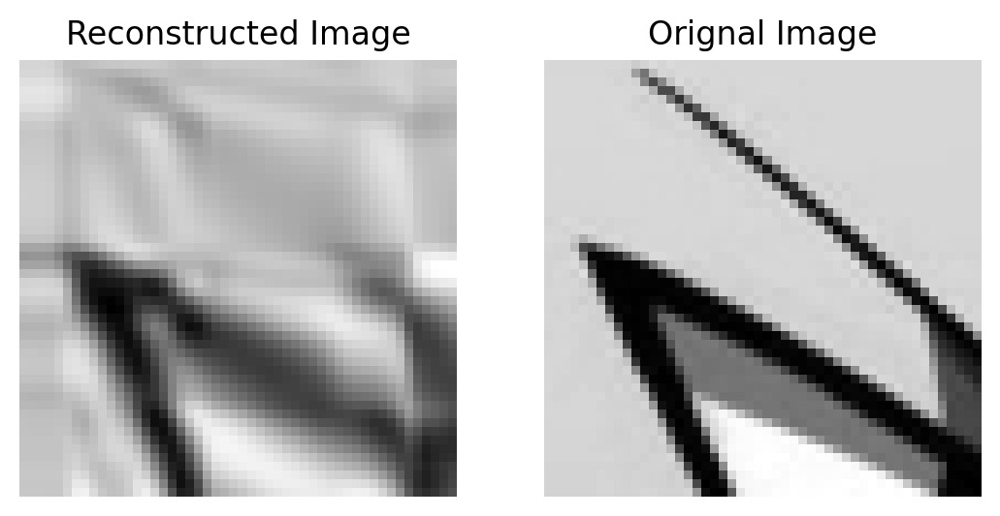

Loss: 917.5469970703125
Number of epochs 5001
Number of Features: 10
Root Mean Squared Error: 18.350906372070312
Peak Signal to Noise Ratio: 22.857650756835938


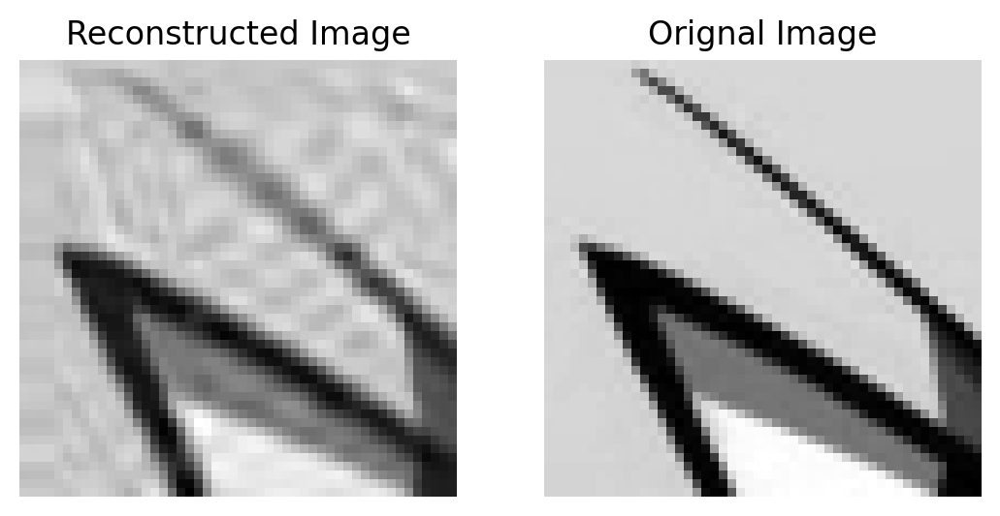

Loss: 221.1885223388672
Number of epochs 2636
Number of Features: 25
Root Mean Squared Error: 4.423768043518066
Peak Signal to Noise Ratio: 35.2149543762207


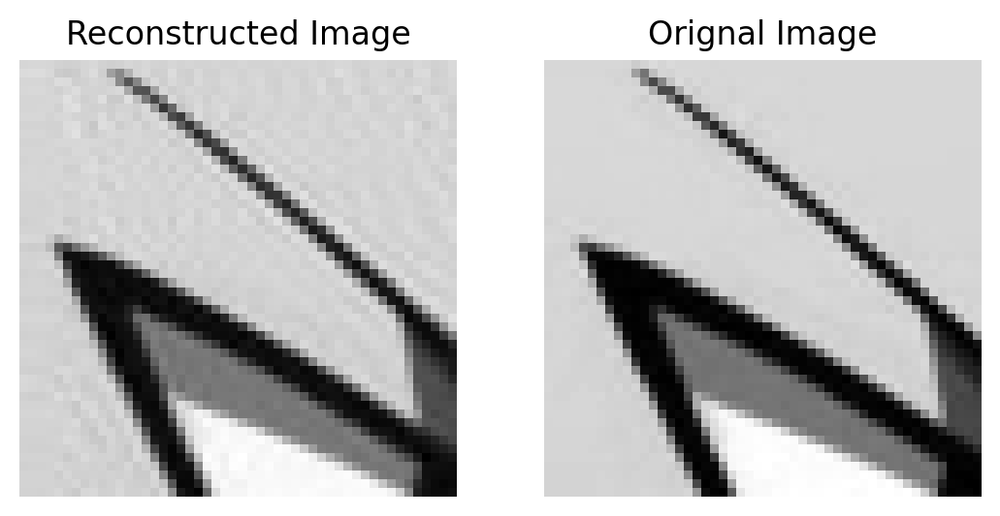

Loss: 4.521475315093994
Number of epochs 1339
Number of Features: 50
Root Mean Squared Error: 0.09029107540845871
Peak Signal to Noise Ratio: 69.01790618896484


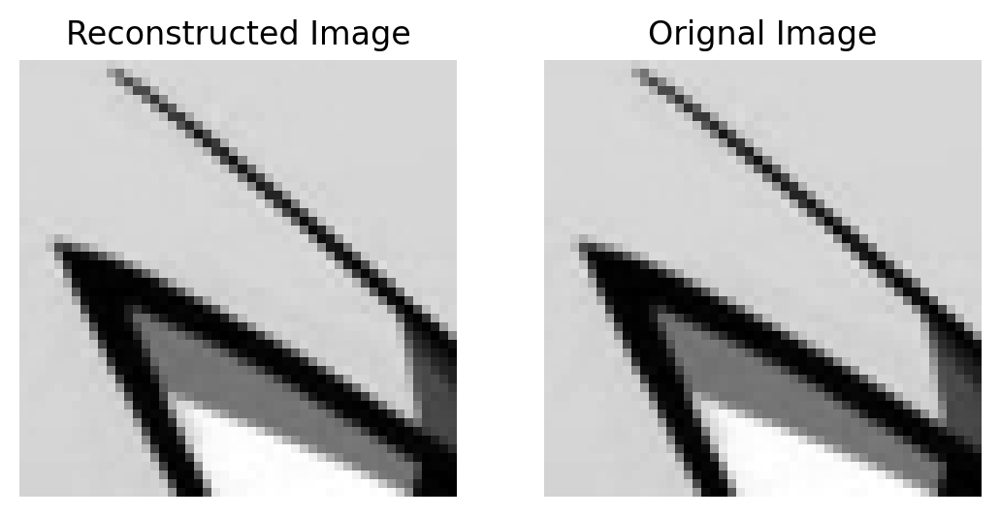

In [54]:
for i in [5, 10, 25, 50]:
    factorize(patch, i)